# **Exploratory Data Analysis (EDA) on Multi-Site Factory Carbon Capture as a Service (CCaaS) Implementation**


## Library

In [ ]:
# Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer, KNNImputer
from scipy.interpolate import interp1d
#plt.style.use('dark_background')
# Setting the aesthetics for seaborn plots
sns.set(style="whitegrid")


## Data Load


In [ ]:
# Load data file to Colab environment
from google.colab import files
uploaded=files.upload()

Saving CCaaS_Data.csv to CCaaS_Data (1).csv


In [ ]:
# Load data from CSV file
data = pd.read_csv("/content/CCaaS_Data.csv")

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120 entries, 0 to 119
Data columns (total 9 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Date                         120 non-null    object 
 1   Site_ID                      120 non-null    object 
 2   CO2_Captured_Tons            114 non-null    float64
 3   Operational_Costs            114 non-null    float64
 4   Energy_Consumption           114 non-null    float64
 5   Revenue_CO2_Sales            114 non-null    float64
 6   Revenue_Carbon_Credits       114 non-null    float64
 7   Plant_Uptime_Percentage      114 non-null    float64
 8   Customer_Satisfaction_Score  114 non-null    float64
dtypes: float64(7), object(2)
memory usage: 8.6+ KB


In [ ]:
# Print the first few rows of the dataset
print("First few rows of the dataset:")
print(data.head())

First few rows of the dataset:
         Date Site_ID  CO2_Captured_Tons  Operational_Costs  \
0  2022-01-31  Site_1         479.474264       12373.095841   
1  2022-02-28  Site_1         386.092445        7271.837636   
2  2022-03-31  Site_1         525.527130       14208.382933   
3  2022-04-30  Site_1         685.664219        5794.446812   
4  2022-05-31  Site_1         394.060283       11760.571281   

   Energy_Consumption  Revenue_CO2_Sales  Revenue_Carbon_Credits  \
0                 NaN        8668.529657             2846.498890   
1          954.105423       10789.986285             1853.351471   
2         1201.994912        7044.991415             1072.264416   
3         1346.302078        8038.466532             3244.156363   
4          519.881437        8528.022591             2092.379106   

   Plant_Uptime_Percentage  Customer_Satisfaction_Score  
0                97.569886                     3.418096  
1                80.778347                     5.874708  
2      

### Adding Missing Value
**This section not required Now**

The dataset generated from CPT does not have missing values, so it has been decided to introduce some random null values to the dataset so they can be imputed during the missing value imputation activity.

In [ ]:
# # Introduce null values randomly (skipping the first two columns)
# print("\nIntroducing null values randomly (skipping Date and Site_ID):")
# num_rows = data.shape[0]
# num_cols = data.shape[1]
# num_nulls = 4  # Number of null values to introduce

# for _ in range(num_nulls):
#     row = np.random.choice(num_rows)
#     col = np.random.choice(range(2, num_cols))  # Skip the first two columns
#     data.iloc[row, col] = np.nan

In [ ]:
# import pandas as pd

# # Assuming you have a DataFrame named 'data'
# data.to_csv('ccaas_dataset_withNaN.csv', index=False)

## Data Cleaning and Preparation

### Handling Missing Values

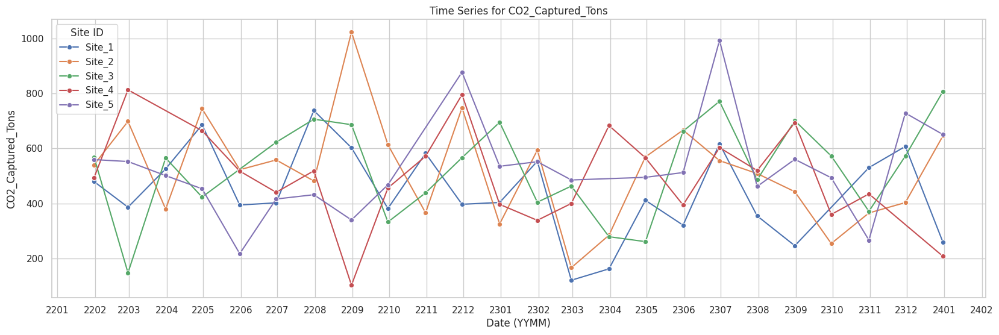

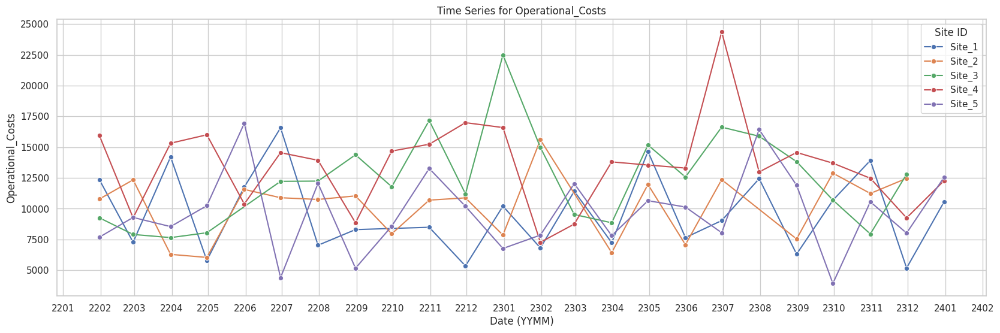

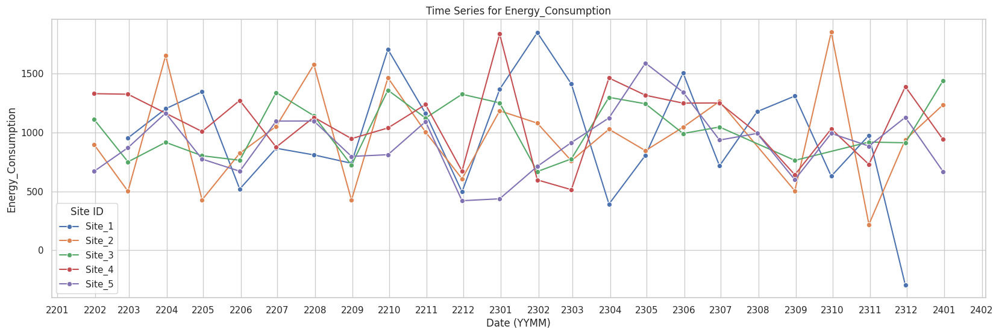

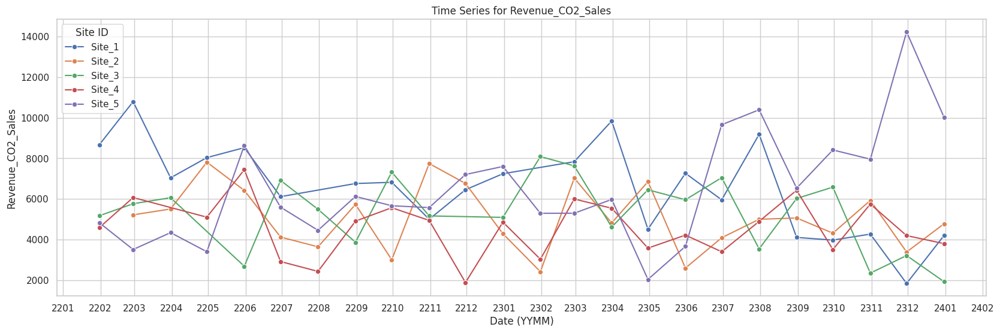

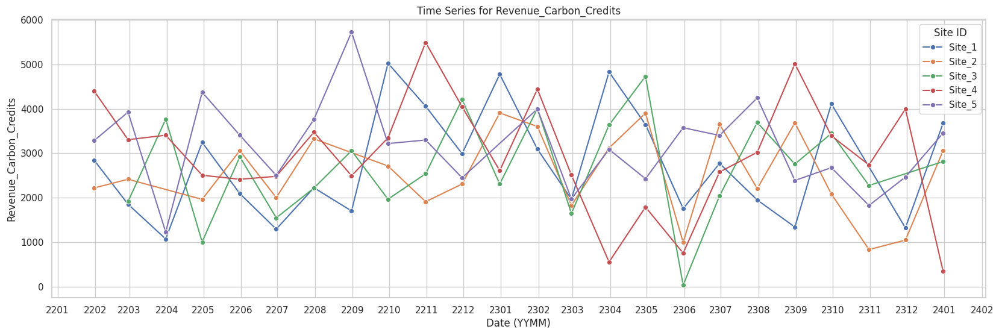

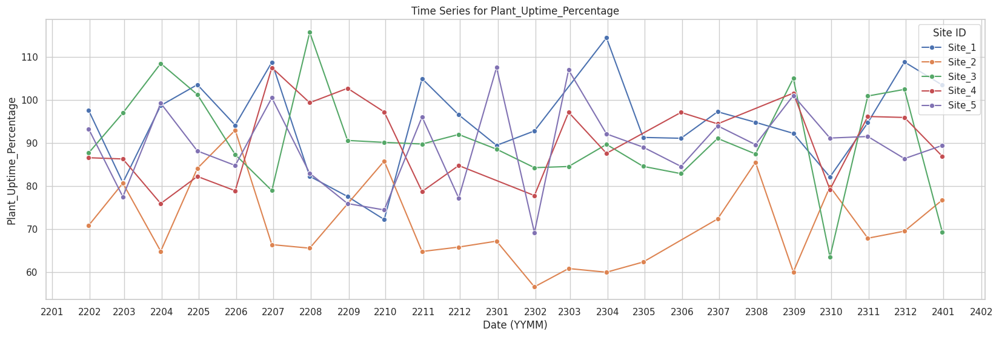

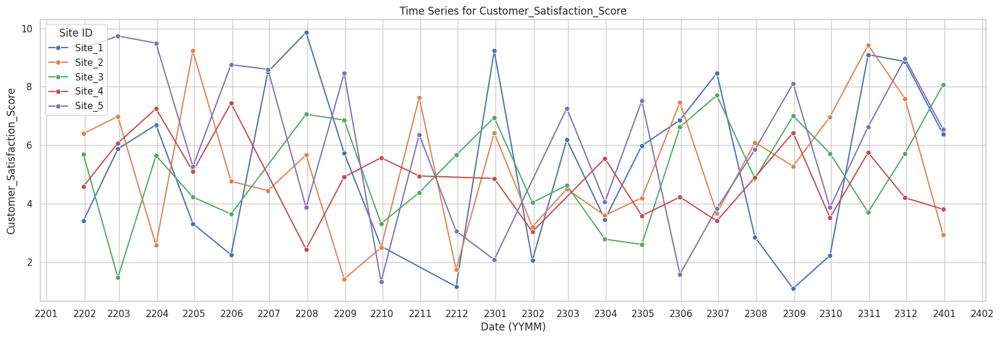

In [ ]:
import matplotlib.dates as mdates

data['Date'] = pd.to_datetime(data['Date'])  # Ensure Date is a datetime object

# Visualizing each parameter for all sites together, site-wise
parameters = ['CO2_Captured_Tons', 'Operational_Costs', 'Energy_Consumption', 'Revenue_CO2_Sales', 'Revenue_Carbon_Credits', 'Plant_Uptime_Percentage', 'Customer_Satisfaction_Score']
for param in parameters:
    plt.figure(figsize=(20, 6))
    #sns.lineplot(data=data, x='Date', y=param, hue='Site_ID', marker='o')
    ax = sns.lineplot(data=data, x='Date', y=param, hue='Site_ID', marker='o')
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%y%m'))  # Format the date as 'YYMM'
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))  # Set major ticks to be every month
    plt.title(f'Time Series for {param}')
    plt.xlabel('Date (YYMM)')
    plt.ylabel(param)
    plt.legend(title='Site ID')
    plt.show()

In [ ]:
# Handling Missing Values
print("\nHandling Missing Values:")
print("Number of missing values in each column:")
print(data.isnull().sum())


Handling Missing Values:
Number of missing values in each column:
Date                           0
Site_ID                        0
CO2_Captured_Tons              6
Operational_Costs              6
Energy_Consumption             6
Revenue_CO2_Sales              6
Revenue_Carbon_Credits         6
Plant_Uptime_Percentage        6
Customer_Satisfaction_Score    6
dtype: int64


Missing value imputation techniques:
1.	Mean / Median / Mode Imputation
    *   Mean – continuous variable
    *   Median – Skewed continuos variable
    *   Mode – categorical variables
2.	Forward / Backward Fill
3.	Interpolation (linear / polynomial / Spline)
4.	K-Nearest Neighbors (KNN) Imputation


In [ ]:
# Check data is skewed or not
from scipy.stats import skew

print("Skewness of columns with missing values:")
print("CO2_Captured_Tons:", skew(data['CO2_Captured_Tons'].dropna()))
print("Operational_Costs:", skew(data['Operational_Costs'].dropna()))
print("Energy_Consumption:", skew(data['Energy_Consumption'].dropna()))
print("Revenue_CO2_Sales:", skew(data['Revenue_CO2_Sales'].dropna()))
print("Revenue_Carbon_Credits:", skew(data['Revenue_Carbon_Credits'].dropna()))
print("Plant_Uptime_Percentage:", skew(data['Plant_Uptime_Percentage'].dropna()))
print("Customer_Satisfaction_Score:", skew(data['Customer_Satisfaction_Score'].dropna()))

Skewness of columns with missing values:
CO2_Captured_Tons: 0.1940862619246729
Operational_Costs: 0.590003844104742
Energy_Consumption: -0.1346702244048381
Revenue_CO2_Sales: 0.7909146525450073
Revenue_Carbon_Credits: 0.039551264103468306
Plant_Uptime_Percentage: -0.27252346939474204
Customer_Satisfaction_Score: 0.11625610999413542


In [ ]:
# Check for data trend patterns (e.g., skewness)
# Exclude non-numeric columns before calculating skewness
numeric_data = data.select_dtypes(include=[np.number])  # Selects only numeric columns
skewness = numeric_data.skew()
print("Skewness in each column:\n", skewness)

Skewness in each column:
 CO2_Captured_Tons              0.196684
Operational_Costs              0.597900
Energy_Consumption            -0.136473
Revenue_CO2_Sales              0.801499
Revenue_Carbon_Credits         0.040081
Plant_Uptime_Percentage       -0.276171
Customer_Satisfaction_Score    0.117812
dtype: float64


A skewness value close to 0 indicates a symmetrical distribution, while values greater than 1 (right-skewed) or less than -1 (left-skewed) indicate a highly skewed distribution.

In [ ]:
# Imputation - Site-wise

# Create a copy of the original DataFrame for comparison
original_df = data.copy()

for site in data['Site_ID'].unique():
    site_index = data[data['Site_ID'] == site].index

    # a. Mean / Median / Mode Imputation
    mean_imputer = SimpleImputer(strategy='mean')
    data.loc[site_index, 'CO2_Captured_Tons'] = mean_imputer.fit_transform(data.loc[site_index, 'CO2_Captured_Tons'].values.reshape(-1, 1))

    median_imputer = SimpleImputer(strategy='median')
    data.loc[site_index, 'Operational_Costs'] = median_imputer.fit_transform(data.loc[site_index, 'Operational_Costs'].values.reshape(-1, 1))

    mode_imputer = SimpleImputer(strategy='most_frequent')
    data.loc[site_index, 'Customer_Satisfaction_Score'] = mode_imputer.fit_transform(data.loc[site_index, 'Customer_Satisfaction_Score'].values.reshape(-1, 1))

    # b. Forward / Backward Fill
    data.loc[site_index, 'Energy_Consumption'].fillna(method='ffill', inplace=True)  # Forward fill
    data.loc[site_index, 'Revenue_CO2_Sales'].fillna(method='bfill', inplace=True)   # Backward fill

    # c. Interpolation (linear/polynomial / Spline)
    data.loc[site_index, 'Revenue_Carbon_Credits'].interpolate(method='linear', inplace=True)
    data.loc[site_index, 'Plant_Uptime_Percentage'].interpolate(method='polynomial', order=2, inplace=True)  # Polynomial interpolation


    # Final catch-all imputation for any remaining missing values using median
    # Median is chosen for its robustness to outliers
    site_data = data.loc[site_index]
    # Identify numeric columns for median imputation
    numeric_columns = site_data.select_dtypes(include=[np.number]).columns

    # Median imputer for remaining missing numeric values
    median_imputer = SimpleImputer(strategy='median')
    site_data[numeric_columns] = median_imputer.fit_transform(site_data[numeric_columns])

    # Update the main DataFrame with the imputed data
    data.loc[site_index, numeric_columns] = site_data[numeric_columns]



In [ ]:
print("Number of missing values in each column:")
print(data.isnull().sum())

Number of missing values in each column:
Date                           0
Site_ID                        0
CO2_Captured_Tons              0
Operational_Costs              0
Energy_Consumption             0
Revenue_CO2_Sales              0
Revenue_Carbon_Credits         0
Plant_Uptime_Percentage        0
Customer_Satisfaction_Score    0
dtype: int64


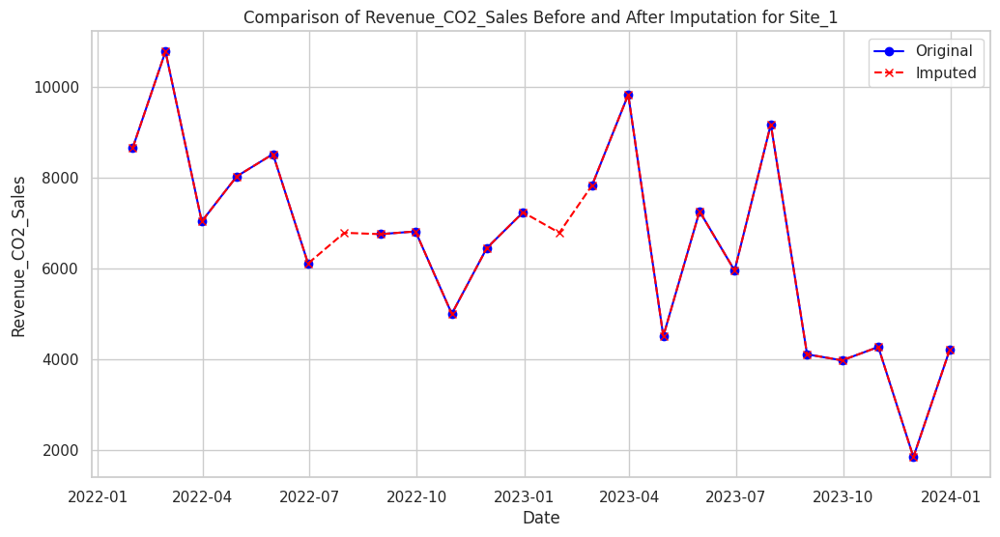

In [ ]:
# Function to plot data comparison
def plot_comparison(original_df, imputed_df, column_name, site_id):
    plt.figure(figsize=(12, 6))

    # Filtering data for a specific site
    original_site_data = original_df[original_df['Site_ID'] == site_id]
    imputed_site_data = imputed_df[imputed_df['Site_ID'] == site_id]

    # Plotting original data
    plt.plot(original_site_data['Date'], original_site_data[column_name], label='Original', marker='o', linestyle='-', color='blue')

    # Plotting imputed data
    plt.plot(imputed_site_data['Date'], imputed_site_data[column_name], label='Imputed', marker='x', linestyle='--', color='red')

    plt.title(f'Comparison of {column_name} Before and After Imputation for {site_id}')
    plt.xlabel('Date')
    plt.ylabel(column_name)
    plt.legend()
    plt.show()

# Example usage of the function for 'CO2_Captured_Tons' and 'Site_1'
plot_comparison(original_df, data, 'Revenue_CO2_Sales', 'Site_1')


In [ ]:
# Save Imputed Dataset
data.to_csv('CCaaS_Data_Imputed.csv', index=False)

## Outlier Detection and Treatment

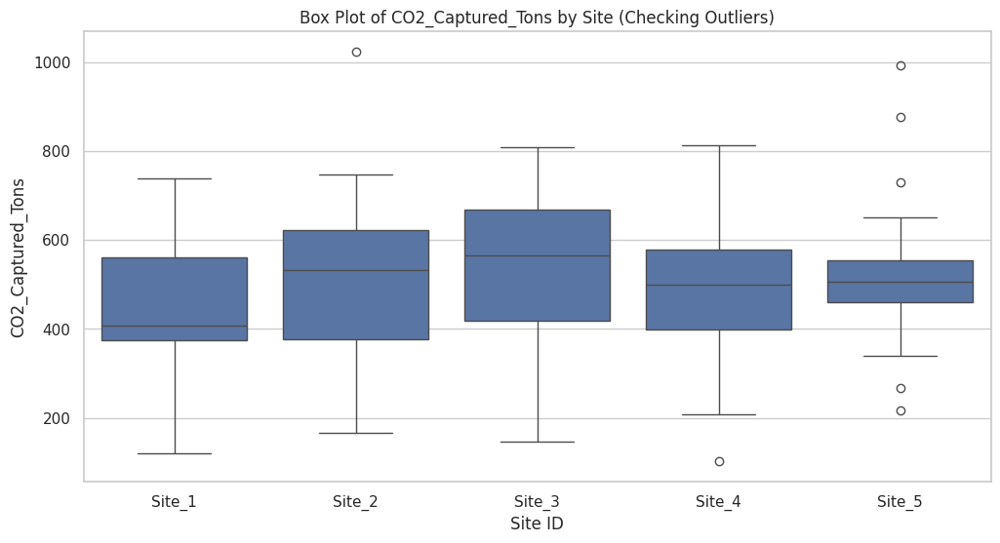

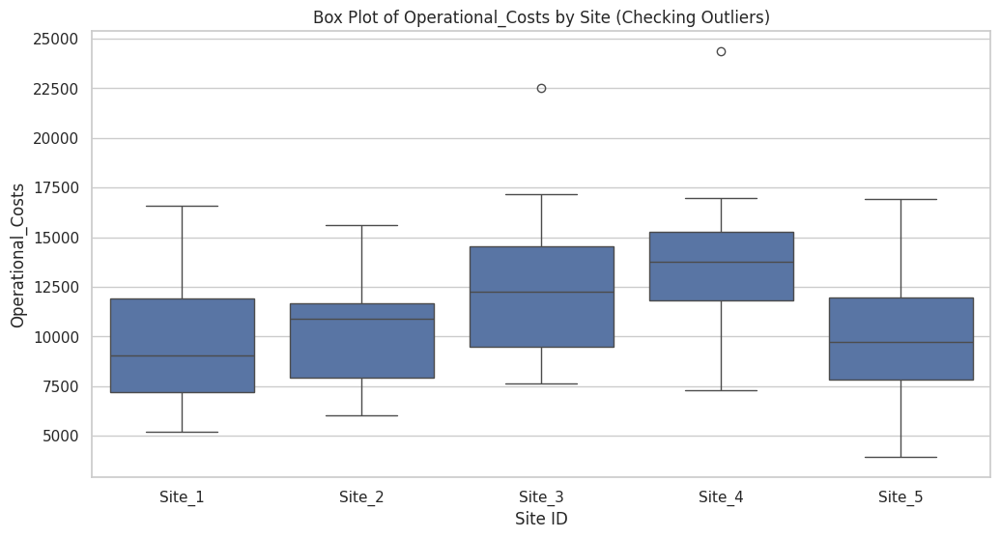

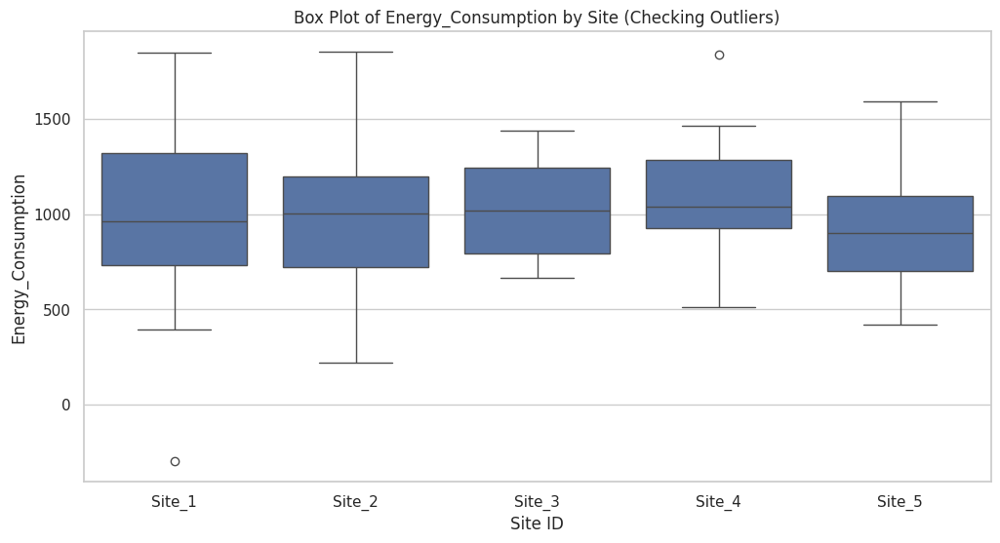

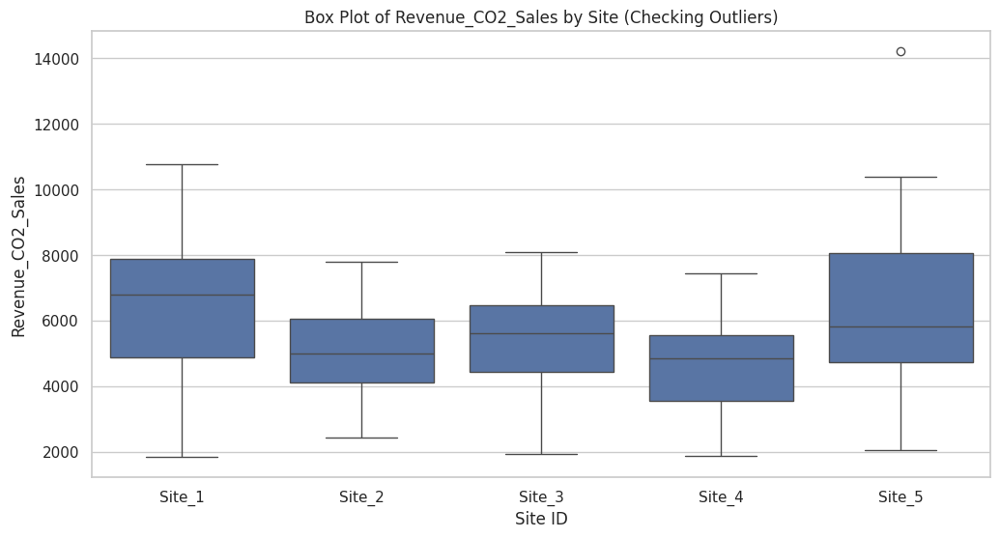

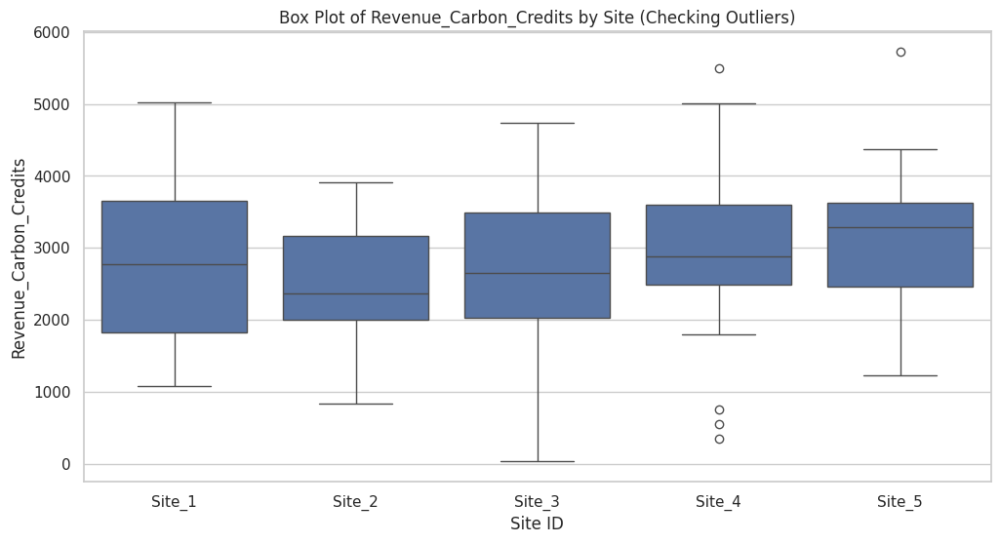

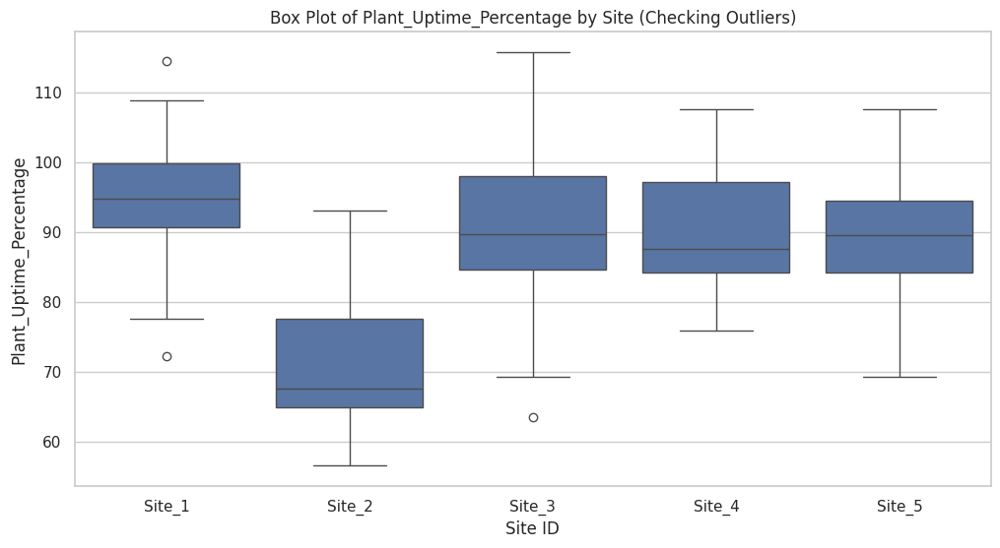

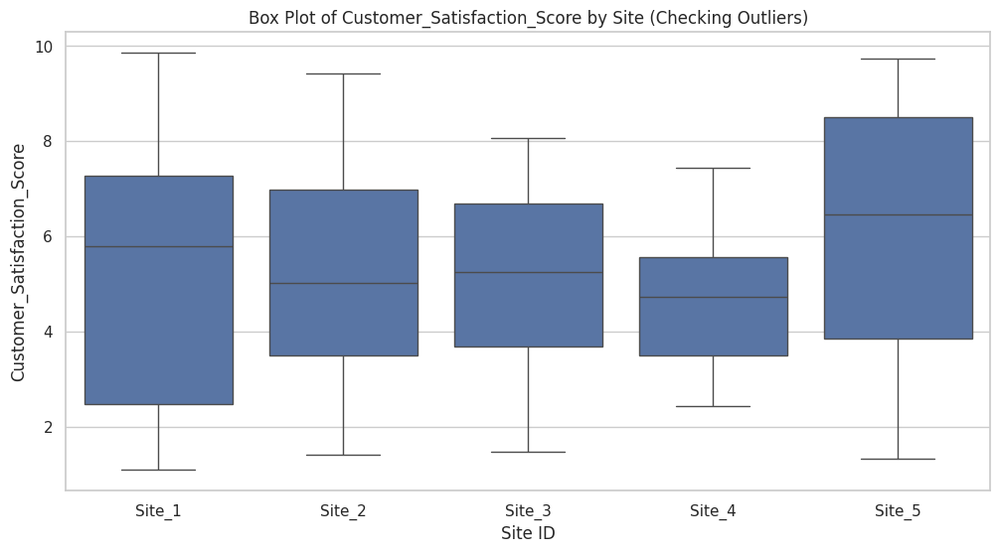

In [ ]:

# Function to detect and flag outliers within each site
def flag_outliers(data, column):
    for site in data['Site_ID'].unique():
        site_index = data[data['Site_ID'] == site].index
        site_data = data.loc[site_index, column]

        # Calculate Q1, Q3, and the IQR
        Q1 = site_data.quantile(0.25)
        Q3 = site_data.quantile(0.75)
        IQR = Q3 - Q1

        # Determine upper and lower bounds for outliers
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Flag outliers directly in the original DataFrame
        data.loc[site_index, f'{column}_outlier'] = ((site_data < lower_bound) | (site_data > upper_bound))

# Apply outlier detection to each numeric column for each site
numeric_columns = data.select_dtypes(include=[np.number]).columns
for column in numeric_columns:
    flag_outliers(data, column)

# Visualizing outliers with box plots
for column in numeric_columns:
    plt.figure(figsize=(12, 6))
    sns.boxplot(x='Site_ID', y=column, data=data)
    plt.title(f'Box Plot of {column} by Site (Checking Outliers)')
    plt.xlabel('Site ID')
    plt.ylabel(column)
    plt.show()


In [ ]:
data.head()

,Date,Site_ID,CO2_Captured_Tons,Operational_Costs,Energy_Consumption,Revenue_CO2_Sales,Revenue_Carbon_Credits,Plant_Uptime_Percentage,Customer_Satisfaction_Score,CO2_Captured_Tons_outlier,Operational_Costs_outlier,Energy_Consumption_outlier,Revenue_CO2_Sales_outlier,Revenue_Carbon_Credits_outlier,Plant_Uptime_Percentage_outlier,Customer_Satisfaction_Score_outlier
0,2022-01-31,Site_1,479.474264,12373.095841,965.147640,8668.529657,2846.498890,97.569886,3.418096,False,False,False,False,False,False,False
1,2022-02-28,Site_1,386.092445,7271.837636,954.105423,10789.986285,1853.351471,80.778347,5.874708,False,False,False,False,False,False,False
2,2022-03-31,Site_1,525.527130,14208.382933,1201.994912,7044.991415,1072.264416,98.696059,6.701304,False,False,False,False,False,False,False
3,2022-04-30,Site_1,685.664219,5794.446812,1346.302078,8038.466532,3244.156363,103.556379,3.320989,False,False,False,False,False,False,False
4,2022-05-31,Site_1,394.060283,11760.571281,519.881437,8528.022591,2092.379106,94.134349,2.254205,False,False,False,False,False,False,False


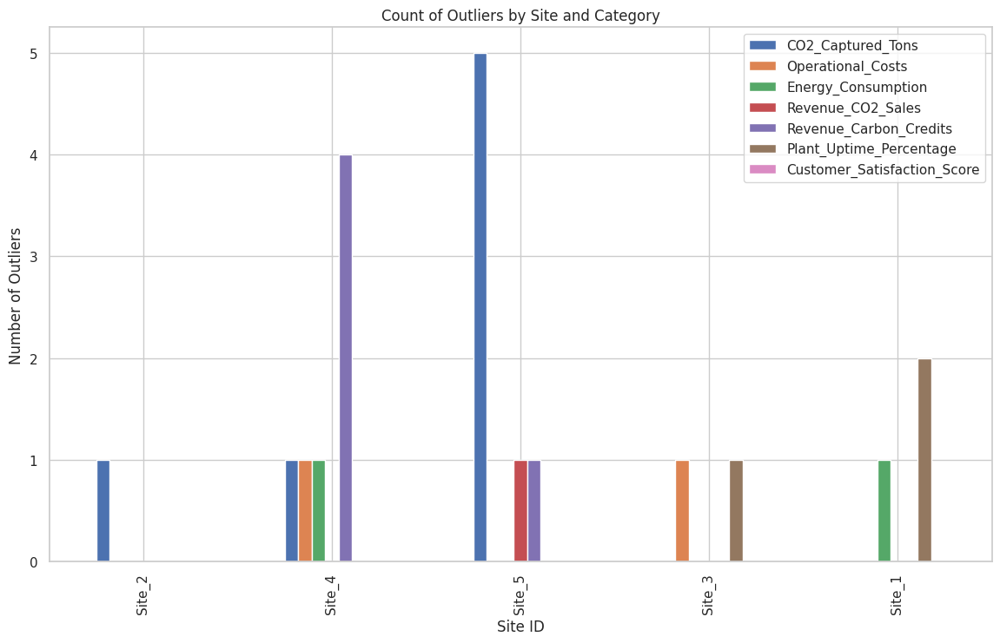

In [ ]:

# Filtering records flagged as outliers and counting them
outlier_counts = pd.DataFrame()
for column in numeric_columns:
    outlier_flag_column = f'{column}_outlier'
    count_data = data[data[outlier_flag_column]][['Site_ID', outlier_flag_column]]
    count_summary = count_data.groupby('Site_ID').count()
    count_summary.rename(columns={outlier_flag_column: column}, inplace=True)
    outlier_counts = pd.concat([outlier_counts, count_summary], axis=1)

# Visualizing outlier counts
outlier_counts.plot(kind='bar', figsize=(14, 8))
plt.title('Count of Outliers by Site and Category')
plt.ylabel('Number of Outliers')
plt.xlabel('Site ID')
plt.show()


In [ ]:
# Sort by Site_ID and display
outlier_counts.sort_index(inplace=True)
outlier_counts

,CO2_Captured_Tons,Operational_Costs,Energy_Consumption,Revenue_CO2_Sales,Revenue_Carbon_Credits,Plant_Uptime_Percentage,Customer_Satisfaction_Score
Site_ID,,,,,,,
Site_1,NaN,NaN,1.0,NaN,NaN,2.0,NaN
Site_2,1.0,NaN,NaN,NaN,NaN,NaN,NaN
Site_3,NaN,1.0,NaN,NaN,NaN,1.0,NaN
Site_4,1.0,1.0,1.0,NaN,4.0,NaN,NaN
Site_5,5.0,NaN,NaN,1.0,1.0,NaN,NaN


In [ ]:
data[data['CO2_Captured_Tons_outlier'] == True ]

,Date,Site_ID,CO2_Captured_Tons,Operational_Costs,Energy_Consumption,Revenue_CO2_Sales,Revenue_Carbon_Credits,Plant_Uptime_Percentage,Customer_Satisfaction_Score,CO2_Captured_Tons_outlier,Operational_Costs_outlier,Energy_Consumption_outlier,Revenue_CO2_Sales_outlier,Revenue_Carbon_Credits_outlier,Plant_Uptime_Percentage_outlier,Customer_Satisfaction_Score_outlier
31,2022-08-31,Site_2,1023.112097,11039.344628,425.655140,5737.878757,2361.661971,67.521133,1.422694,True,False,False,False,False,False,False
79,2022-08-31,Site_4,102.486217,8856.685317,947.942778,4916.678452,2494.818623,102.715551,4.916678,True,False,False,False,False,False,False
100,2022-05-31,Site_5,216.925852,16943.975700,671.111842,8638.138804,3406.195689,84.772770,8.758384,True,False,False,False,False,False,False
106,2022-11-30,Site_5,877.237180,10192.840057,420.766263,7208.478322,2448.766921,77.195706,3.070080,True,False,False,False,False,False,False
113,2023-06-30,Site_5,992.648422,8045.198957,936.024588,9655.861267,3400.394526,93.991361,3.837613,True,False,False,False,False,False,False
117,2023-10-31,Site_5,266.264392,10559.362944,884.536544,7962.622620,1825.483541,91.503018,6.633022,True,False,False,False,False,False,False
118,2023-11-30,Site_5,728.564563,8014.640606,1129.087424,14218.387880,2466.848088,86.363878,8.973800,True,False,False,True,False,False,False


### Outlier Detection and Treatment
**Cap or Floor Outliers**
This method involves setting thresholds beyond which all data points will be capped at a maximum or floored at a minimum value. This approach is useful when you want to retain all data points but limit the effect extreme values can have.

In [ ]:
def cap_and_floor(data, column):
    # Determine the 1st and 99th percentiles
    lower_bound = data[column].quantile(0.01)
    upper_bound = data[column].quantile(0.99)

    # Cap and floor values at the 1st and 99th percentiles
    data[column] = np.where(data[column] < lower_bound, lower_bound, data[column])
    data[column] = np.where(data[column] > upper_bound, upper_bound, data[column])

# Apply to each numeric column for each site
for column in numeric_columns:
    cap_and_floor(data, column)


# Clip the 'Plant_Uptime_Percentage' so that all values above 100 are set to 100
data['Plant_Uptime_Percentage'] = data['Plant_Uptime_Percentage'].clip(upper=100)

In [ ]:
data[data['CO2_Captured_Tons_outlier'] == True ]

,Date,Site_ID,CO2_Captured_Tons,Operational_Costs,Energy_Consumption,Revenue_CO2_Sales,Revenue_Carbon_Credits,Plant_Uptime_Percentage,Customer_Satisfaction_Score,CO2_Captured_Tons_outlier,Operational_Costs_outlier,Energy_Consumption_outlier,Revenue_CO2_Sales_outlier,Revenue_Carbon_Credits_outlier,Plant_Uptime_Percentage_outlier,Customer_Satisfaction_Score_outlier
31,2022-08-31,Site_2,970.720286,11039.344628,425.655140,5737.878757,2361.661971,67.521133,1.422694,True,False,False,False,False,False,False
79,2022-08-31,Site_4,125.532603,8856.685317,947.942778,4916.678452,2494.818623,100.000000,4.916678,True,False,False,False,False,False,False
100,2022-05-31,Site_5,216.925852,16943.975700,671.111842,8638.138804,3406.195689,84.772770,8.758384,True,False,False,False,False,False,False
106,2022-11-30,Site_5,877.237180,10192.840057,420.766263,7208.478322,2448.766921,77.195706,3.070080,True,False,False,False,False,False,False
113,2023-06-30,Site_5,970.720286,8045.198957,936.024588,9655.861267,3400.394526,93.991361,3.837613,True,False,False,False,False,False,False
117,2023-10-31,Site_5,266.264392,10559.362944,884.536544,7962.622620,1825.483541,91.503018,6.633022,True,False,False,False,False,False,False
118,2023-11-30,Site_5,728.564563,8014.640606,1129.087424,10713.893480,2466.848088,86.363878,8.973800,True,False,False,True,False,False,False


### Data Type Consistency



In [ ]:
# Convert the 'Date' column to datetime data type
data['Date'] = pd.to_datetime(data['Date'])

# Convert 'Site_ID' into a categorical variable
data['Site_ID'] = data['Site_ID'].astype('category')

# Drop all columns ending with '_outlier'
outlier_columns = [col for col in data.columns if col.endswith('_outlier')]
data.drop(columns=outlier_columns, inplace=True)

# Check for any other data type inconsistencies
# Print data types of all columns to review them
print(data.dtypes)

# Check the first few rows to ensure the data looks consistent
print(data.head())

Date                           datetime64[ns]
Site_ID                              category
CO2_Captured_Tons                     float64
Operational_Costs                     float64
Energy_Consumption                    float64
Revenue_CO2_Sales                     float64
Revenue_Carbon_Credits                float64
Plant_Uptime_Percentage               float64
Customer_Satisfaction_Score           float64
dtype: object
        Date Site_ID  CO2_Captured_Tons  Operational_Costs  \
0 2022-01-31  Site_1         479.474264       12373.095841   
1 2022-02-28  Site_1         386.092445        7271.837636   
2 2022-03-31  Site_1         525.527130       14208.382933   
3 2022-04-30  Site_1         685.664219        5794.446812   
4 2022-05-31  Site_1         394.060283       11760.571281   

   Energy_Consumption  Revenue_CO2_Sales  Revenue_Carbon_Credits  \
0          965.147640        8668.529657             2846.498890   
1          954.105423       10713.893480             1853.35147

## Feature Engineering

In [ ]:

# Operational efficiency metrics
data['CO2_Capture_Efficiency'] = data['CO2_Captured_Tons'] / data['Energy_Consumption']
data['Revenue_per_Ton_CO2'] = data['Revenue_CO2_Sales'] / data['CO2_Captured_Tons']
# Calculate Profit
# Assuming 'Revenue_CO2_Sales' and 'Revenue_Carbon_Credits' are the total revenue components,
# and 'Operational_Costs' are the total costs for the period
data['Profit'] = (data['Revenue_CO2_Sales'] + data['Revenue_Carbon_Credits']) - data['Operational_Costs']

# Calculate Cost per Ton
# Avoid division by zero by replacing zero CO2 captured tons with NaN or a small number if that approach is not suitable
data['Cost_per_Ton'] = data['Operational_Costs'] / data['CO2_Captured_Tons'].replace(0, pd.NA)

# Rolling averages
data['RollingAvg_CO2_Captured'] = data.groupby('Site_ID')['CO2_Captured_Tons'].transform(lambda x: x.rolling(window=3, min_periods=1).mean())
data['RollingAvg_Operational_Costs'] = data.groupby('Site_ID')['Operational_Costs'].transform(lambda x: x.rolling(window=3, min_periods=1).mean())

# Lagged features
data['Lagged_CO2_Captured'] = data.groupby('Site_ID')['CO2_Captured_Tons'].shift(1)

# Checking the new features
print(data[['CO2_Capture_Efficiency', 'Revenue_per_Ton_CO2', 'Profit', 'Cost_per_Ton', 'RollingAvg_CO2_Captured', 'Lagged_CO2_Captured']].head())


   CO2_Capture_Efficiency  Revenue_per_Ton_CO2       Profit  Cost_per_Ton  \
0                0.496789            18.079239  -858.067294     25.805547   
1                0.404664            27.749555  5295.407316     18.834447   
2                0.437212            13.405571 -6091.127102     27.036440   
3                0.509294            11.723620  5488.176084      8.450852   
4                0.757981            21.641416 -1140.169585     29.844599   

   RollingAvg_CO2_Captured  Lagged_CO2_Captured  
0               479.474264                  NaN  
1               432.783355           479.474264  
2               463.697946           386.092445  
3               532.427931           525.527130  
4               535.083877           685.664219  


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120 entries, 0 to 119
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   Date                          120 non-null    datetime64[ns]
 1   Site_ID                       120 non-null    category      
 2   CO2_Captured_Tons             120 non-null    float64       
 3   Operational_Costs             120 non-null    float64       
 4   Energy_Consumption            120 non-null    float64       
 5   Revenue_CO2_Sales             120 non-null    float64       
 6   Revenue_Carbon_Credits        120 non-null    float64       
 7   Plant_Uptime_Percentage       120 non-null    float64       
 8   Customer_Satisfaction_Score   120 non-null    float64       
 9   CO2_Capture_Efficiency        120 non-null    float64       
 10  Revenue_per_Ton_CO2           120 non-null    float64       
 11  Profit                        12

In [ ]:
# Save Imputed Dataset
data.to_csv('CCaaS_Data_NewFeatures.csv', index=False)

## Descriptive Statistics


### Summary Statistics:

Generate mean, median, mode, standard deviation, etc., for key variables like CO2 capture volumes, operational costs, and revenue from carbon credits

In [ ]:


# Define key variables for analysis
key_variables = ['CO2_Captured_Tons', 'Operational_Costs', 'Energy_Consumption', 'Revenue_CO2_Sales',
                 'Revenue_Carbon_Credits', 'Plant_Uptime_Percentage', 'Customer_Satisfaction_Score',
                 'Profit', 'Cost_per_Ton']

# Calculate descriptive statistics and mode for each site
grouped_stats = {}
for key in key_variables:
    grouped = data.groupby('Site_ID')[key]
    stats = grouped.describe()
    mode = grouped.apply(lambda x: x.mode().iloc[0])  # Take the first mode if there are multiple
    stats['mode'] = mode
    grouped_stats[key] = stats

for var in key_variables:
  # Print grouped descriptive statistics for a sample variable
  print(f'Descriptive - Summary Statistivs for: {var}')
  print(grouped_stats[var])  # Example to print statistics for 'CO2_Captured_Tons'
  print('*'*100)




Descriptive - Summary Statistivs for: CO2_Captured_Tons
         count        mean         std         min         25%         50%  \
Site_ID                                                                      
Site_1    24.0  441.772106  157.020283  125.532603  374.636181  407.224113   
Site_2    24.0  516.666010  183.246882  166.060343  375.845913  531.290393   
Site_3    24.0  526.093710  170.563493  147.391969  418.278946  565.534740   
Site_4    24.0  499.414069  163.918340  125.532603  398.822933  498.453803   
Site_5    24.0  523.875304  163.851186  216.925852  459.416499  506.534367   

                75%         max        mode  
Site_ID                                      
Site_1   560.384554  737.805448  125.532603  
Site_2   621.496997  970.720286  166.060343  
Site_3   668.442879  807.607313  147.391969  
Site_4   579.230257  812.928731  498.453803  
Site_5   553.964305  970.720286  524.788976  
***************************************************************************

•	Distribution Analysis: Assess the distribution of continuous variables to understand their spread and central tendency, which can highlight operational efficiencies or areas for improvement.

Descriptive Statistics for CO2_Captured_Tons:


,count,mean,std,min,25%,50%,75%,max
Site_ID,,,,,,,,
Site_1,24.0,441.772106,157.020283,125.532603,374.636181,407.224113,560.384554,737.805448
Site_2,24.0,516.666010,183.246882,166.060343,375.845913,531.290393,621.496997,970.720286
Site_3,24.0,526.093710,170.563493,147.391969,418.278946,565.534740,668.442879,807.607313
Site_4,24.0,499.414069,163.918340,125.532603,398.822933,498.453803,579.230257,812.928731
Site_5,24.0,523.875304,163.851186,216.925852,459.416499,506.534367,553.964305,970.720286


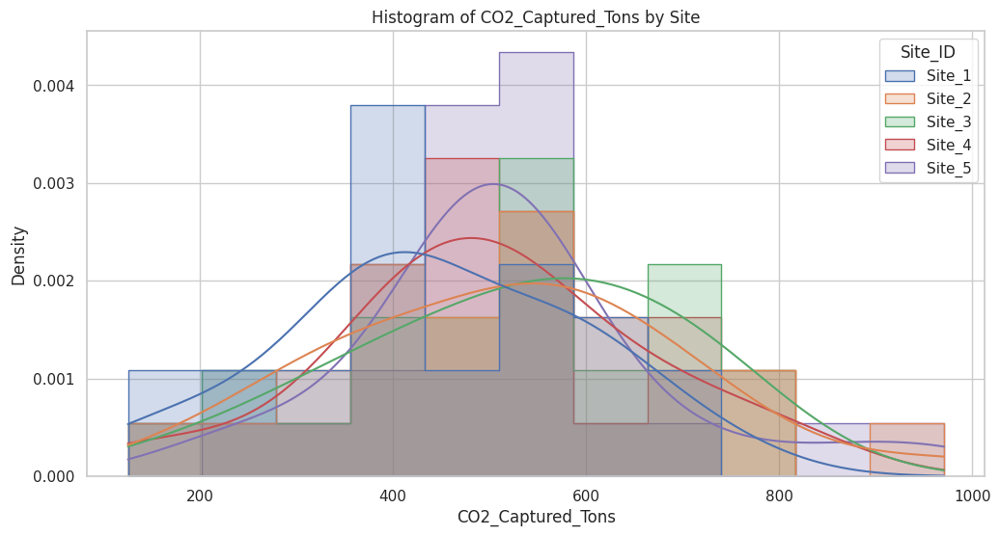

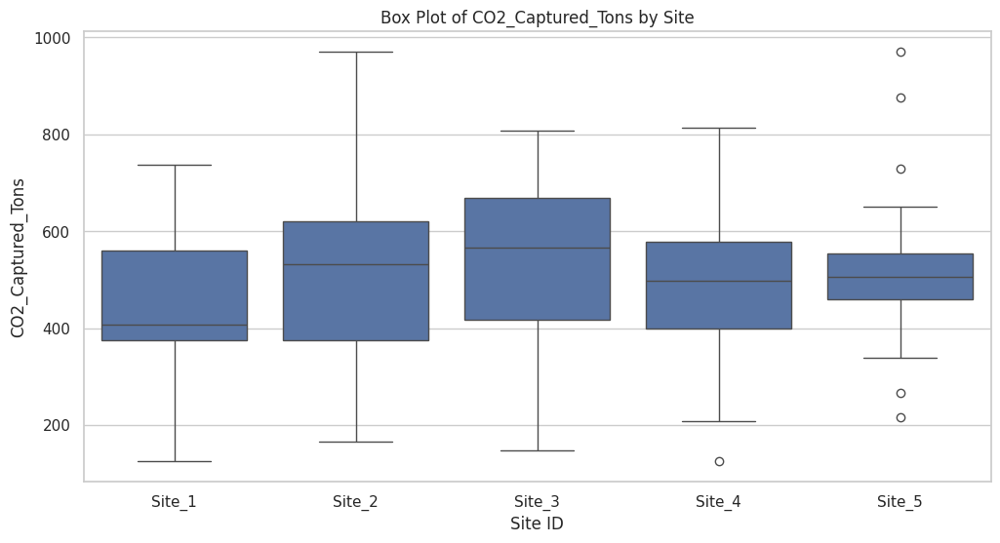

Descriptive Statistics for Operational_Costs:


,count,mean,std,min,25%,50%,75%,max
Site_ID,,,,,,,,
Site_1,24.0,9678.289884,3201.503141,5177.550296,7188.393229,9033.815451,11913.702421,16571.366877
Site_2,24.0,10303.911943,2420.168987,6038.630161,7934.180813,10879.217420,11666.783729,15597.323533
Site_3,24.0,12363.757394,3444.695104,7650.215699,9461.879226,12232.174096,14529.524610,21489.976621
Site_4,24.0,13383.924716,3227.176506,7269.968219,11803.592702,13752.381286,15258.875056,21489.976621
Site_5,24.0,9742.517971,3221.241640,4543.297535,7842.791680,9713.129850,11936.016112,16943.975700


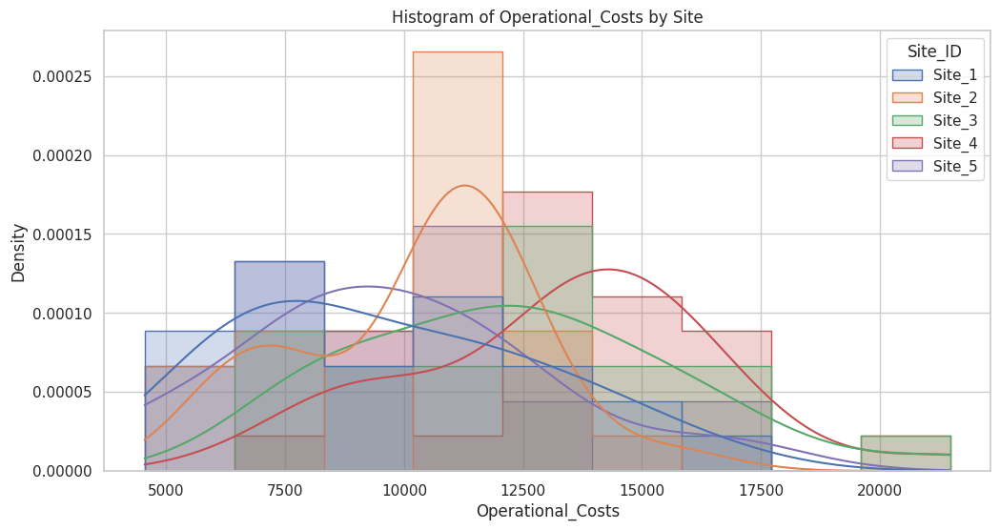

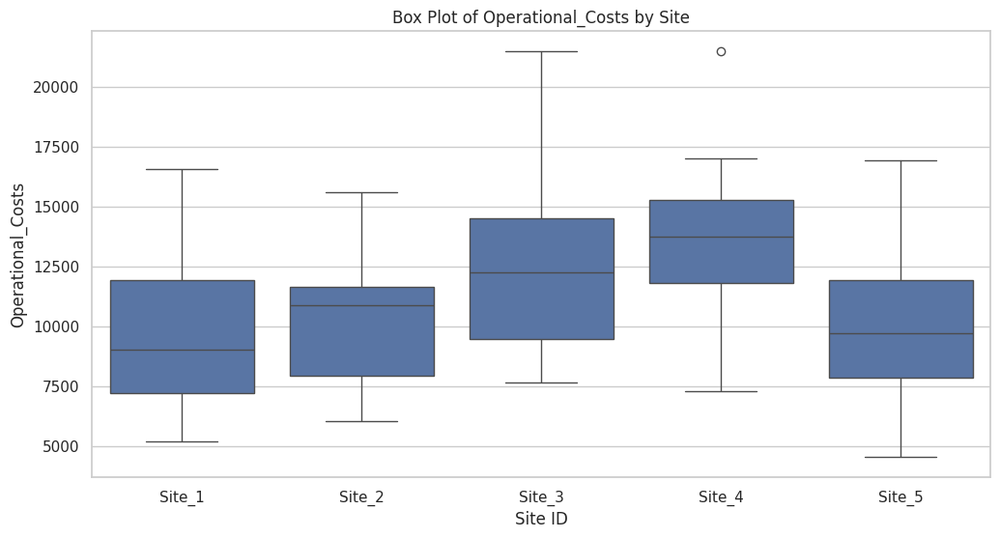

Descriptive Statistics for Energy_Consumption:


,count,mean,std,min,25%,50%,75%,max
Site_ID,,,,,,,,
Site_1,24.0,1005.213587,411.128232,252.051436,733.234284,965.147640,1318.965735,1846.600041
Site_2,24.0,976.109586,408.661297,252.051436,721.784072,1004.093224,1197.462763,1846.600041
Site_3,24.0,1029.659563,233.762301,668.401996,796.081616,1019.285158,1246.073964,1439.510741
Site_4,24.0,1076.469864,312.643292,514.324555,924.856110,1038.798386,1283.752161,1836.954910
Site_5,24.0,908.102356,275.189554,420.766263,702.244694,899.578842,1097.602821,1590.142487


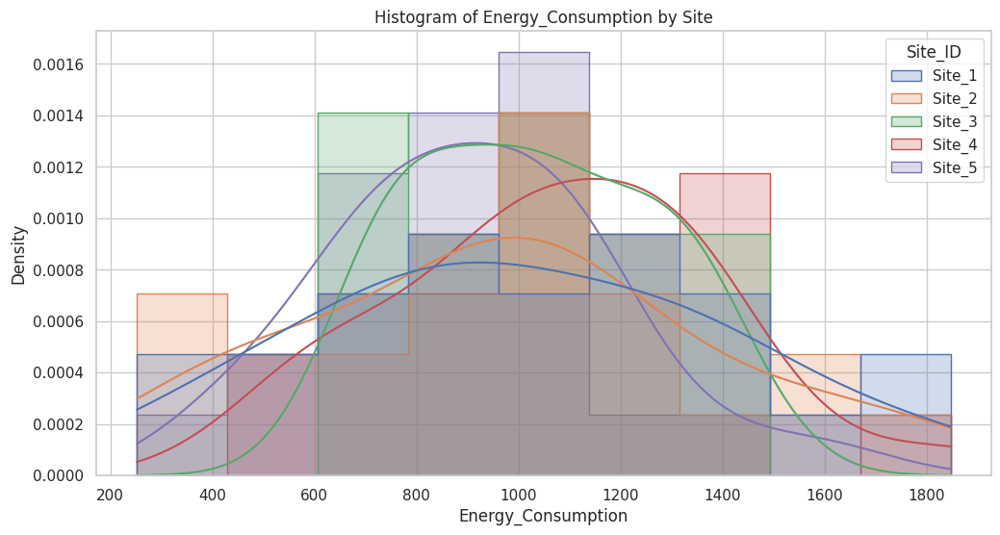

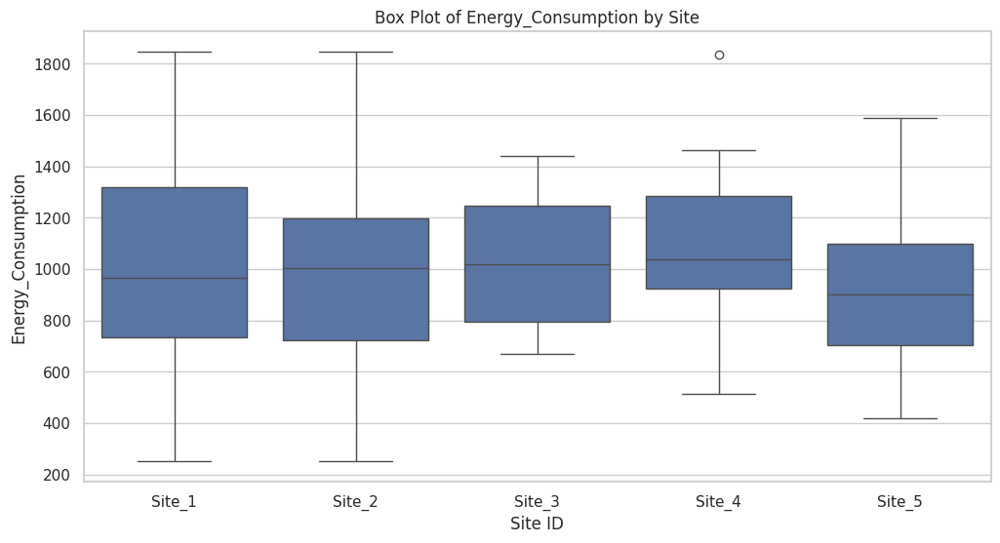

Descriptive Statistics for Revenue_CO2_Sales:


,count,mean,std,min,25%,50%,75%,max
Site_ID,,,,,,,,
Site_1,24.0,6588.329449,2090.985599,1906.876678,4886.588075,6794.657134,7888.617982,10713.893480
Site_2,24.0,5071.706218,1518.335089,2430.298206,4126.217754,5007.865550,6057.115113,7814.256259
Site_3,24.0,5350.366425,1675.956451,1941.151733,4439.232882,5635.064635,6489.926502,8091.121887
Site_4,24.0,4589.334804,1337.184965,1906.876678,3572.987973,4866.319941,5556.447570,7442.923318
Site_5,24.0,6376.549294,2379.682496,2051.613335,4746.011554,5827.682339,8075.657940,10713.893480


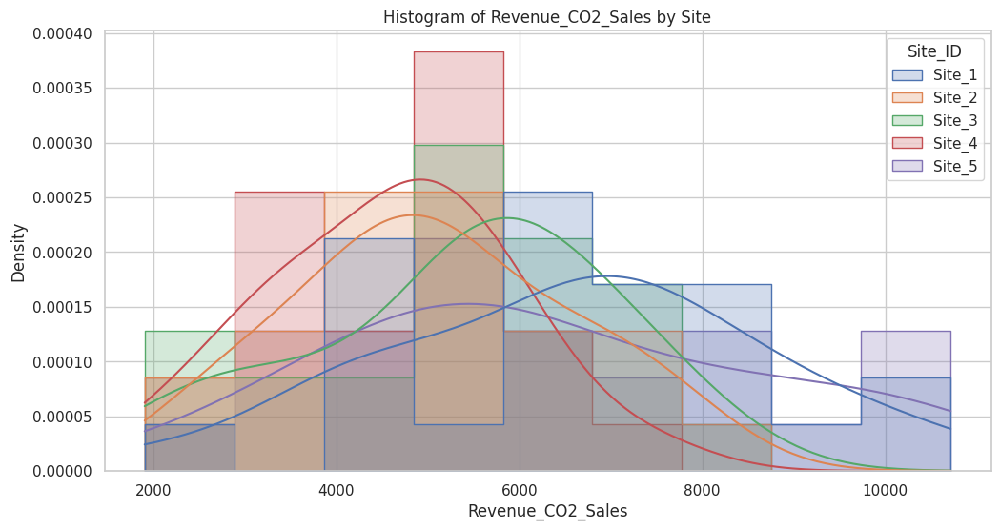

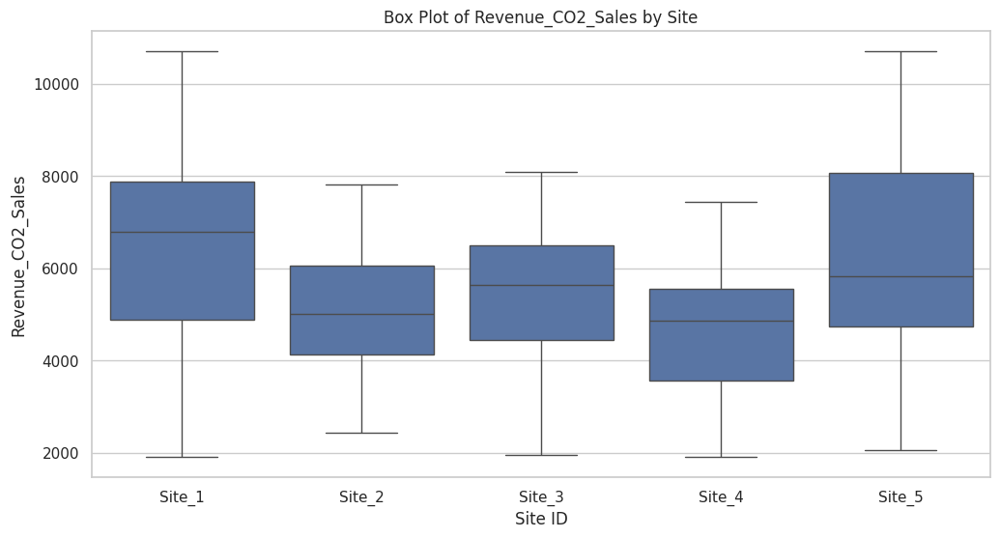

Descriptive Statistics for Plant_Uptime_Percentage:


,count,mean,std,min,25%,50%,75%,max
Site_ID,,,,,,,,
Site_1,24.0,92.508828,7.958504,72.212798,90.681499,94.714684,99.022044,100.000000
Site_2,24.0,70.782861,9.414343,59.969587,64.813187,67.521133,77.521952,92.988981
Site_3,24.0,89.129230,9.453024,63.490302,84.557167,89.715608,97.721548,100.000000
Site_4,24.0,89.373735,8.037523,75.924883,84.121556,87.596746,97.114696,100.000000
Site_5,24.0,88.600207,8.917354,69.180706,84.152248,89.527098,94.508546,100.000000


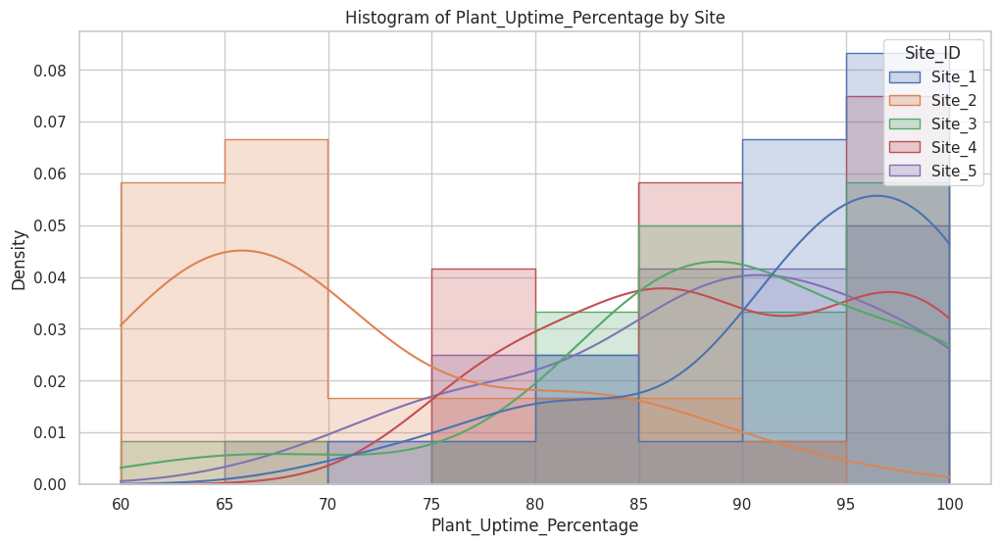

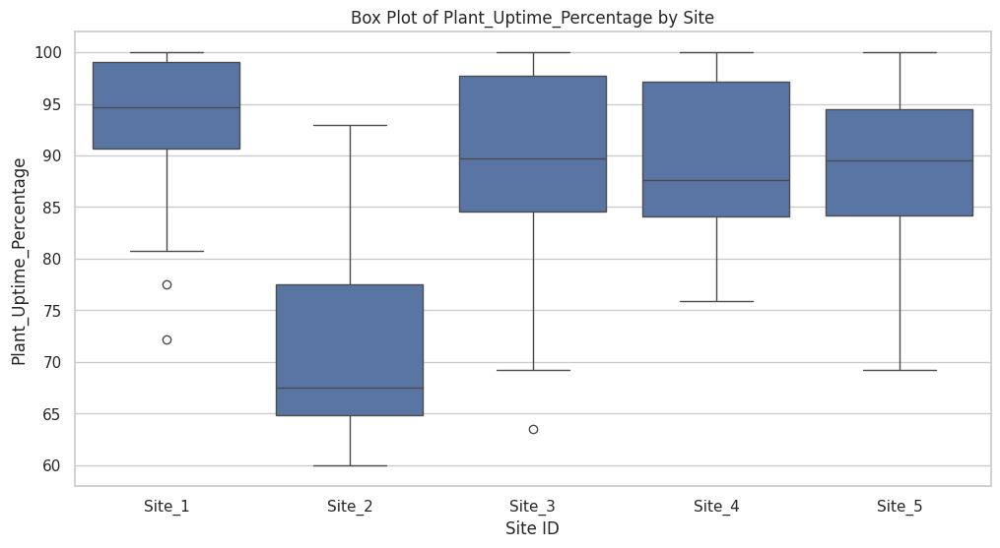

In [ ]:
continuous_vars = ['CO2_Captured_Tons', 'Operational_Costs', 'Energy_Consumption', 'Revenue_CO2_Sales', 'Plant_Uptime_Percentage']
# Generate descriptive statistics and plot distributions
for var in continuous_vars:
    # Display the statistical summary for each site
    print(f"Descriptive Statistics for {var}:")
    display(data.groupby('Site_ID')[var].describe())

    # Plotting histograms and box plots for each variable by site
    plt.figure(figsize=(12, 6))
    sns.histplot(data, x=var, hue='Site_ID', element='step', stat='density', common_norm=False, kde=True)
    plt.title(f'Histogram of {var} by Site')
    plt.xlabel(var)
    plt.ylabel('Density')
    plt.show()

    plt.figure(figsize=(12, 6))
    sns.boxplot(x='Site_ID', y=var, data=data)
    plt.title(f'Box Plot of {var} by Site')
    plt.xlabel('Site ID')
    plt.ylabel(var)
    plt.show()

## Temporal Analysis
•	Trend Analysis: Examine time series data for trends in CO2 capture rates, costs, and revenues over time to identify seasonal patterns or long-term changes.


•	Cohort Analysis: Group data by time periods (e.g., month of service start) to analyze the performance and outcomes of different cohorts over time.


In [ ]:
#Checking for Stationarity
#First, we'll check if the time series data for CO2 capture rates,costs, and revenues are stationary.
#This means the statistical properties of these series such as mean, variance, and covariance do not change over time.

from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose


# Function to perform the Dickey-Fuller test
def test_stationarity(timeseries, title='Stationarity Check'):
    print(f'Results of Dickey-Fuller Test for {title}:')
    dftest = adfuller(timeseries.dropna(), autolag='AIC')  # Drop NaN for the test
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
    for key, value in dftest[4].items():
        dfoutput[f'Critical Value ({key})'] = value
    print(dfoutput, '\n')

continuous_vars = ['CO2_Captured_Tons', 'Operational_Costs', 'Energy_Consumption', 'Revenue_CO2_Sales', 'Revenue_Carbon_Credits']
for site in data['Site_ID'].unique():
  for var in continuous_vars:
    print(f'Dickey -Fuller Test: {site} parameter: {var}')
    # Example for checking stationarity for CO2_Captured_Tons at Site 1
    test_stationarity(data[data['Site_ID'] == site][var], f'{var} at {site}')
    print('*' * 100)


Dickey -Fuller Test: Site_1 parameter: CO2_Captured_Tons
Results of Dickey-Fuller Test for CO2_Captured_Tons at Site_1:
Test Statistic                 -0.927825
p-value                         0.778671
#Lags Used                      8.000000
Number of Observations Used    15.000000
Critical Value (1%)            -3.964443
Critical Value (5%)            -3.084908
Critical Value (10%)           -2.681814
dtype: float64 

****************************************************************************************************
Dickey -Fuller Test: Site_1 parameter: Operational_Costs
Results of Dickey-Fuller Test for Operational_Costs at Site_1:
Test Statistic                 -1.974626
p-value                         0.297808
#Lags Used                      4.000000
Number of Observations Used    19.000000
Critical Value (1%)            -3.832603
Critical Value (5%)            -3.031227
Critical Value (10%)           -2.655520
dtype: float64 

***************************************************

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120 entries, 0 to 119
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   Date                          120 non-null    datetime64[ns]
 1   Site_ID                       120 non-null    category      
 2   CO2_Captured_Tons             120 non-null    float64       
 3   Operational_Costs             120 non-null    float64       
 4   Energy_Consumption            120 non-null    float64       
 5   Revenue_CO2_Sales             120 non-null    float64       
 6   Revenue_Carbon_Credits        120 non-null    float64       
 7   Plant_Uptime_Percentage       120 non-null    float64       
 8   Customer_Satisfaction_Score   120 non-null    float64       
 9   CO2_Capture_Efficiency        120 non-null    float64       
 10  Revenue_per_Ton_CO2           120 non-null    float64       
 11  Profit                        12

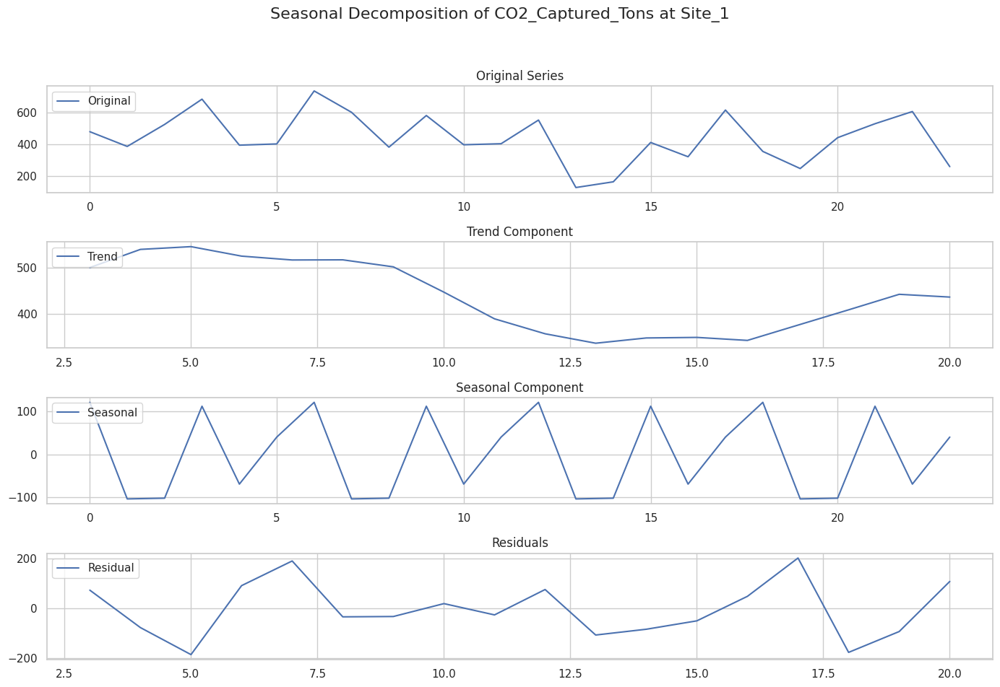

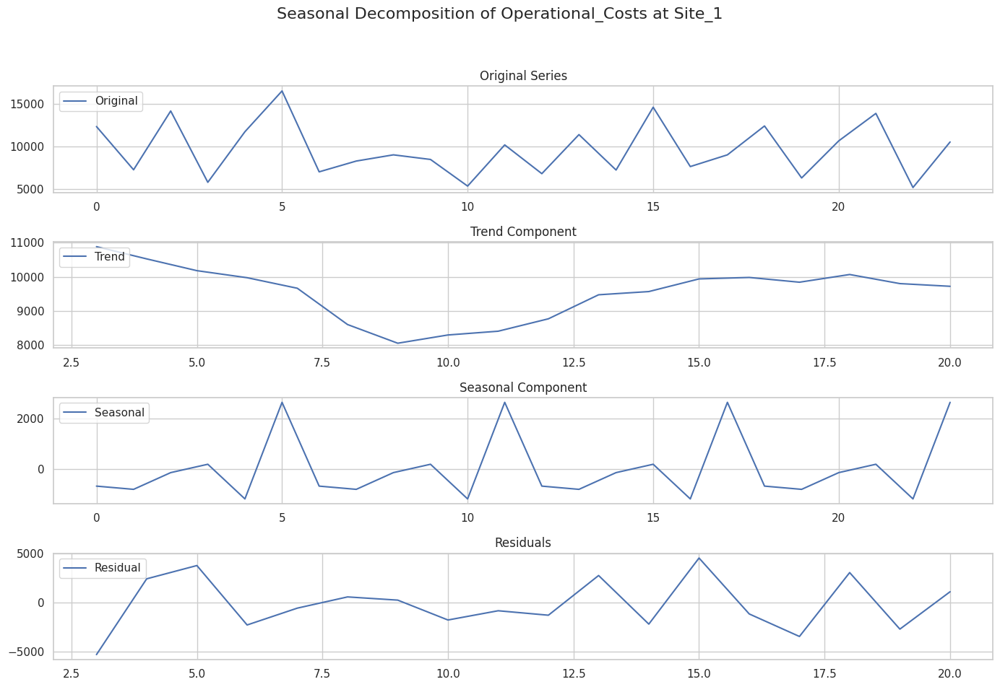

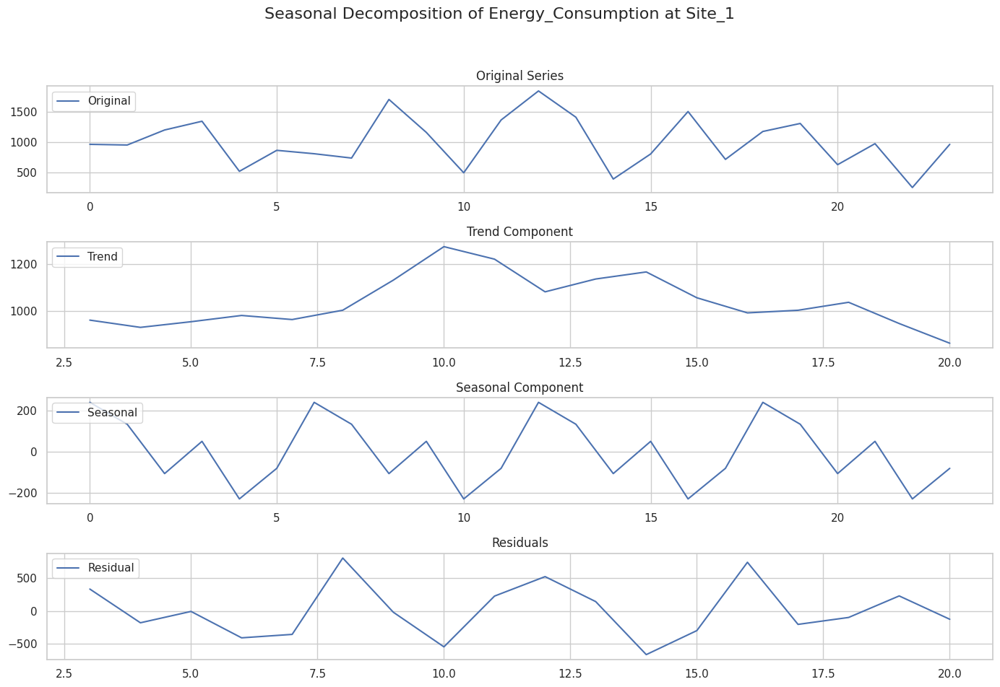

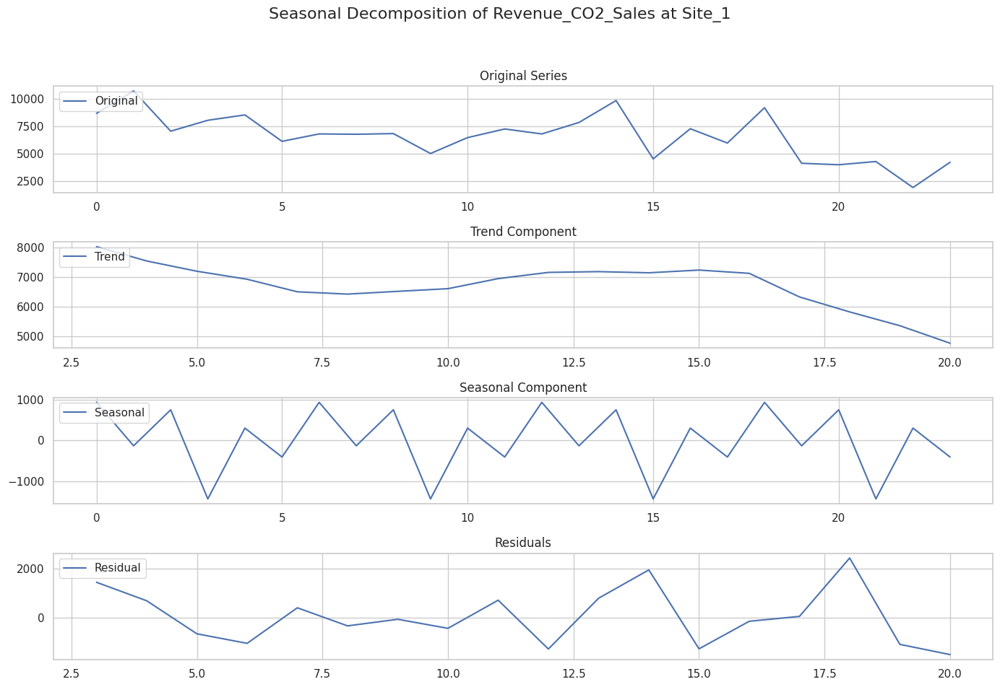

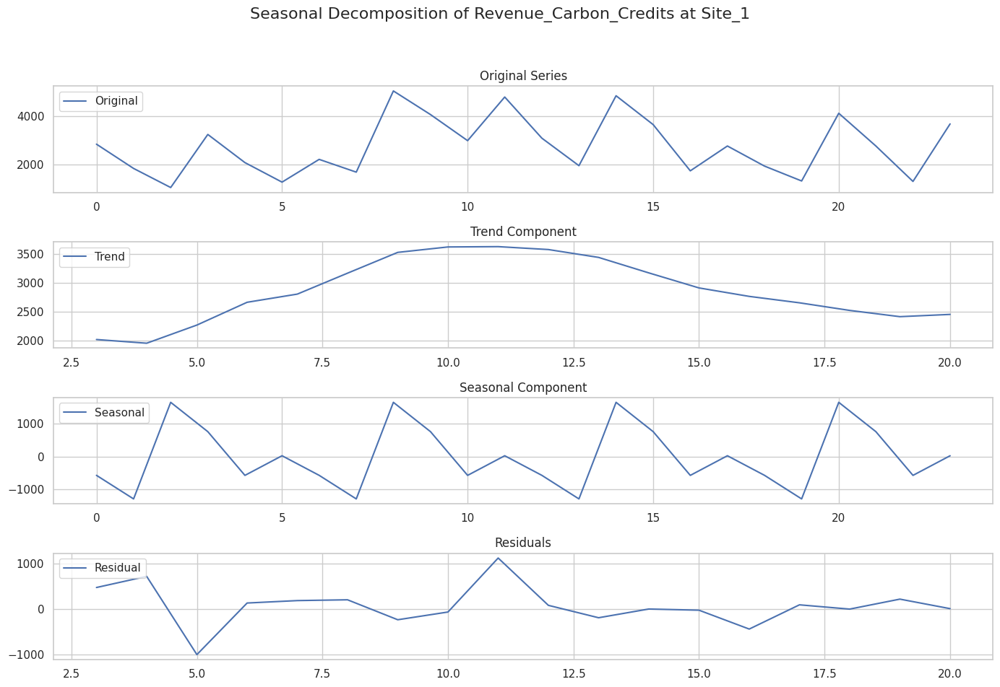

...

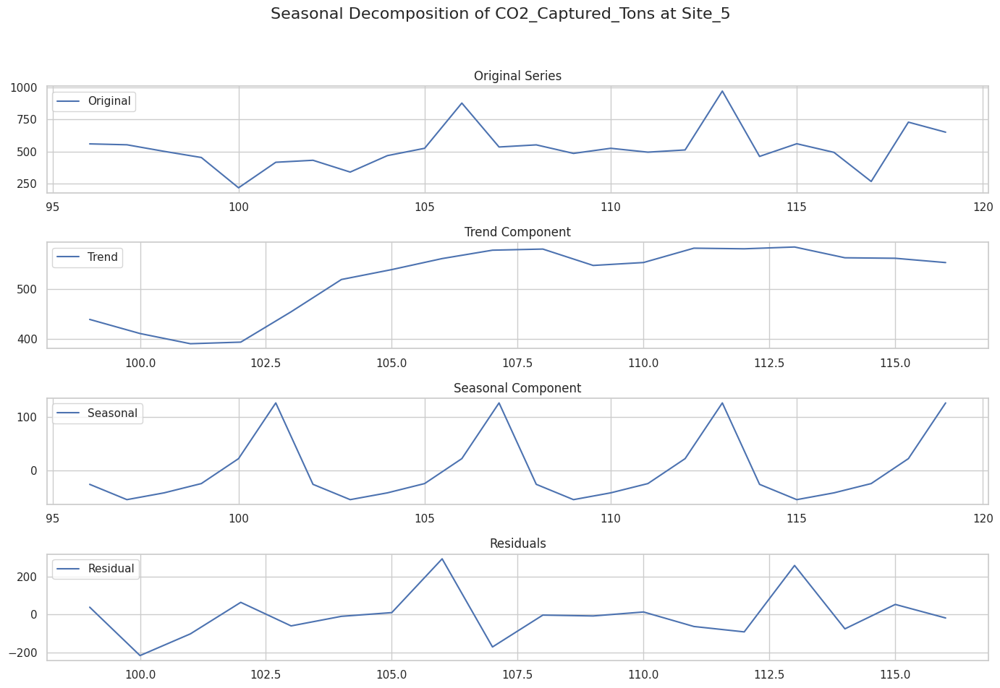

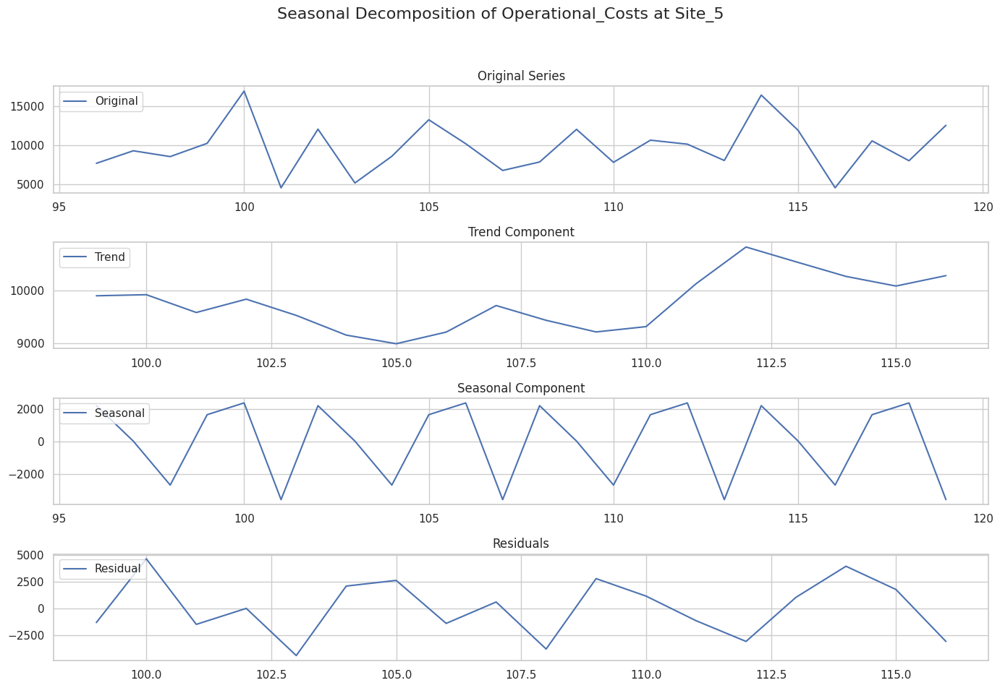

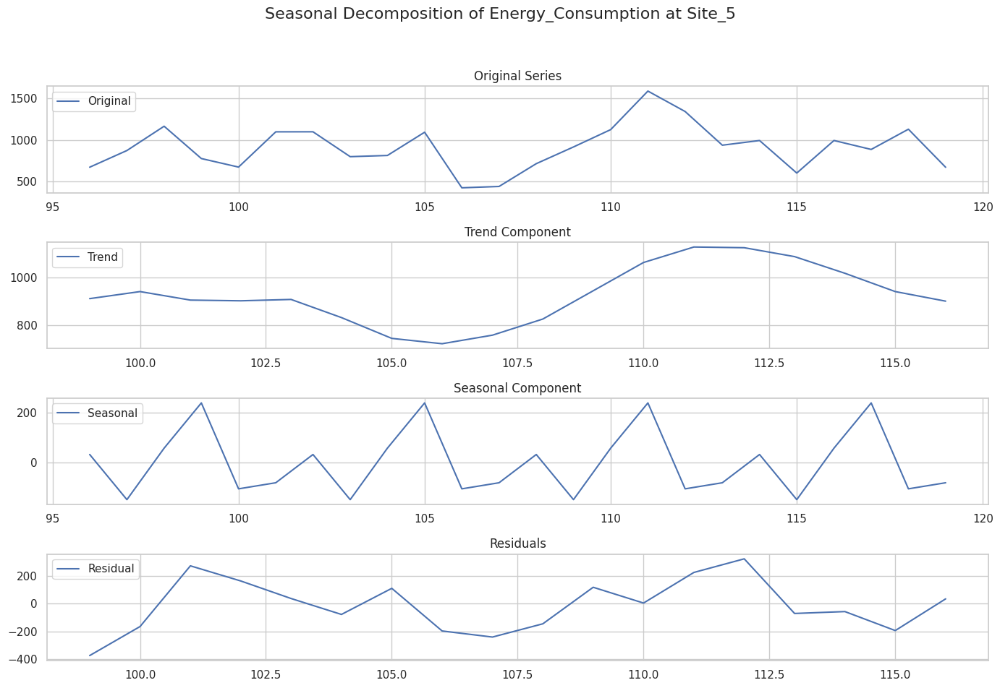

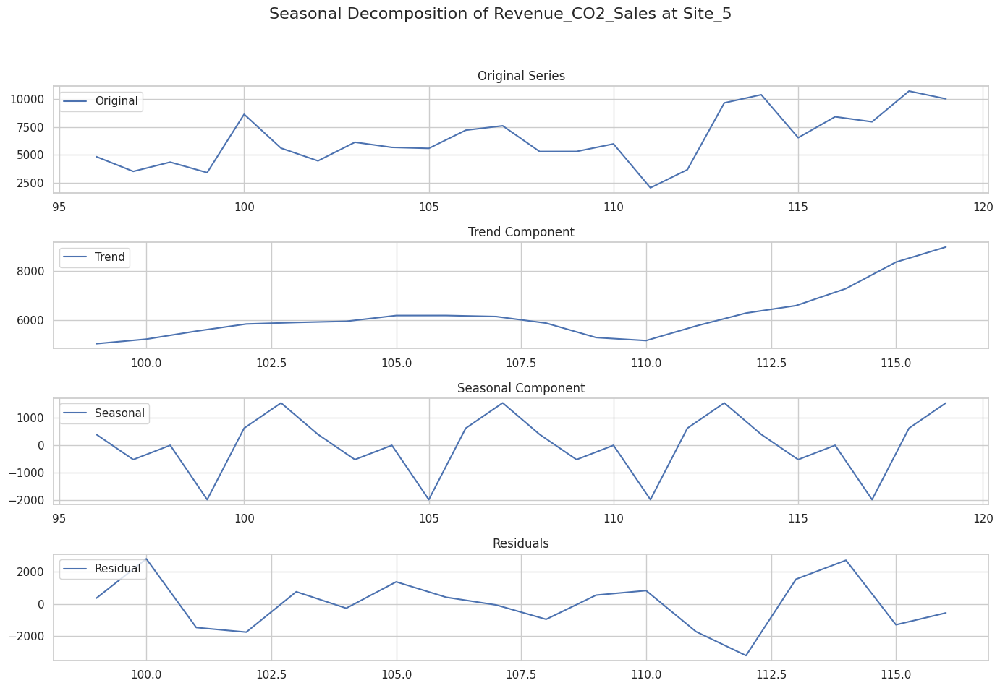

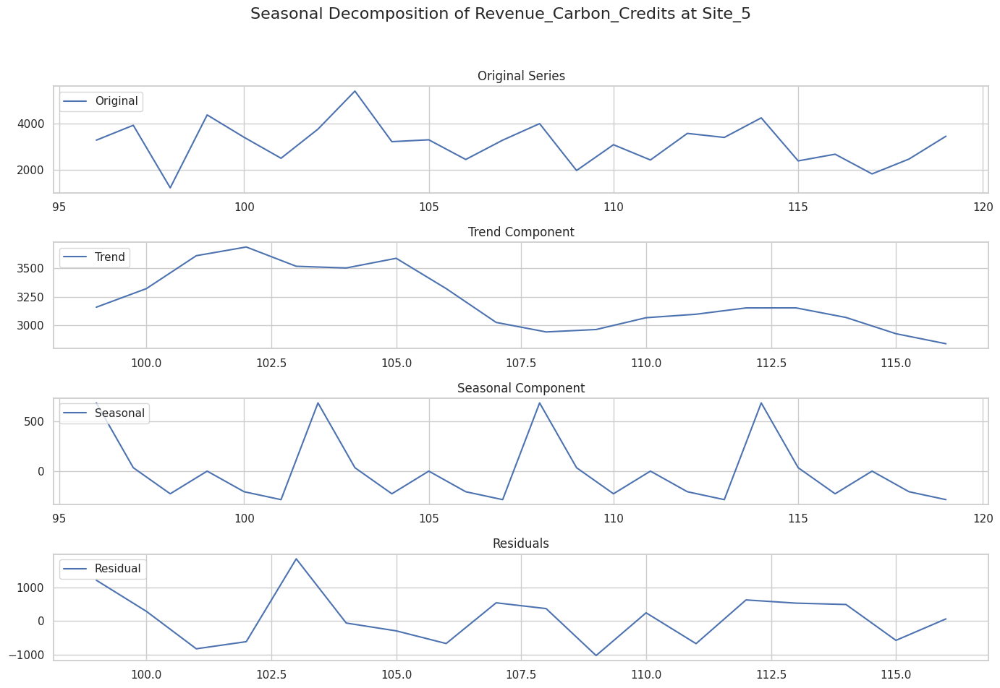

In [ ]:
# Seasonality Check using seasonal_decompose
# We'll decompose the time series to observe the underlying trends and seasonality.


# Loop over each site and each variable
for site in data['Site_ID'].unique():
    for var in continuous_vars:
        # Filter the data for the current site and variable
        site_data = data[data['Site_ID'] == site]

        # Check if there's enough data to decompose
        if len(site_data[var].dropna()) >= 2 * 6:  # Ensure there's at least twice the period's worth of data
            result = seasonal_decompose(site_data[var].dropna(), model='additive', period=6)  # Adjust period accordingly

            # Plotting the decomposed time series components
            plt.figure(figsize=(14, 10))
            plt.suptitle(f'Seasonal Decomposition of {var} at {site}', fontsize=16)

            plt.subplot(411)
            plt.plot(result.observed, label='Original')
            plt.title('Original Series')
            plt.legend(loc='upper left')

            plt.subplot(412)
            plt.plot(result.trend, label='Trend')
            plt.title('Trend Component')
            plt.legend(loc='upper left')

            plt.subplot(413)
            plt.plot(result.seasonal, label='Seasonal')
            plt.title('Seasonal Component')
            plt.legend(loc='upper left')

            plt.subplot(414)
            plt.plot(result.resid, label='Residual')
            plt.title('Residuals')
            plt.legend(loc='upper left')

            plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to not overlap with the suptitle
            plt.show()
        else:
            print(f"Not enough data to decompose {var} at {site}")


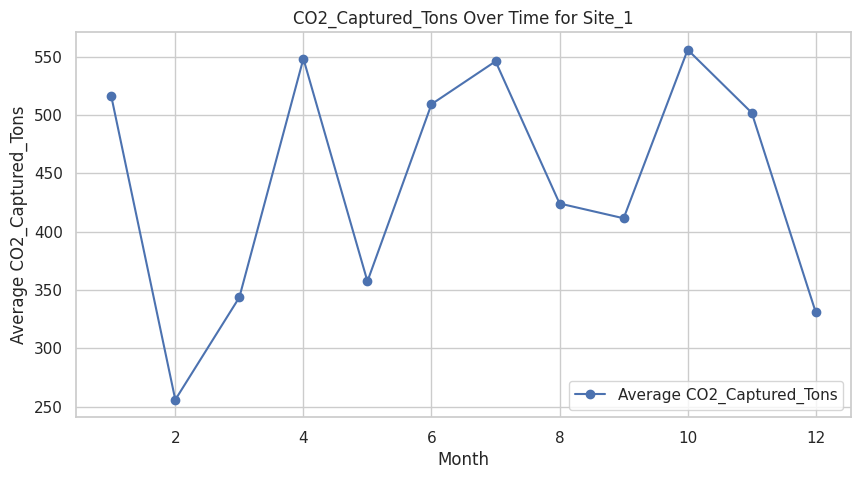

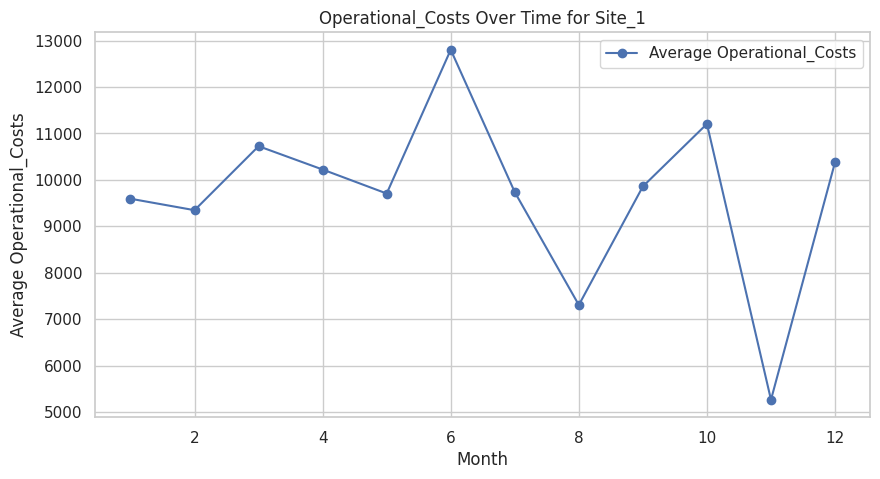

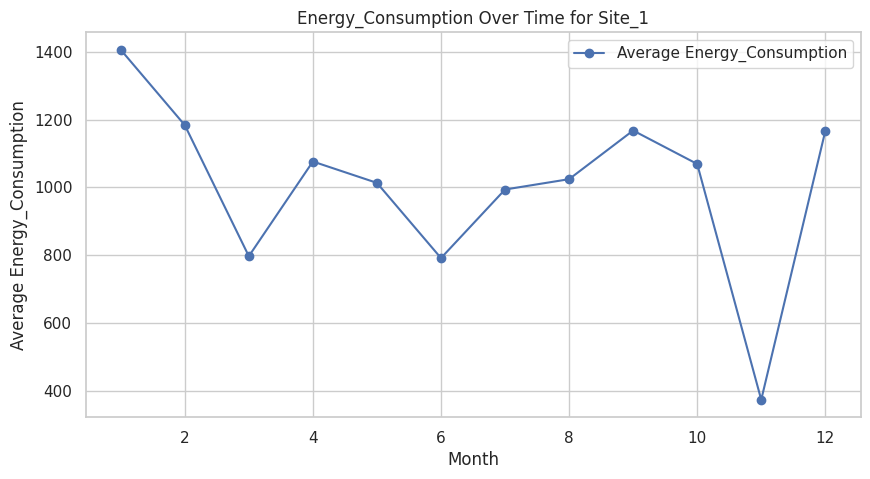

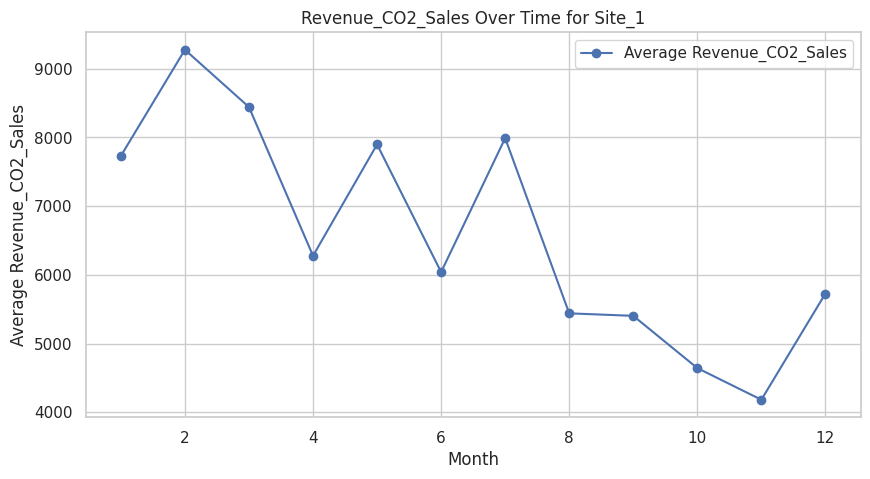

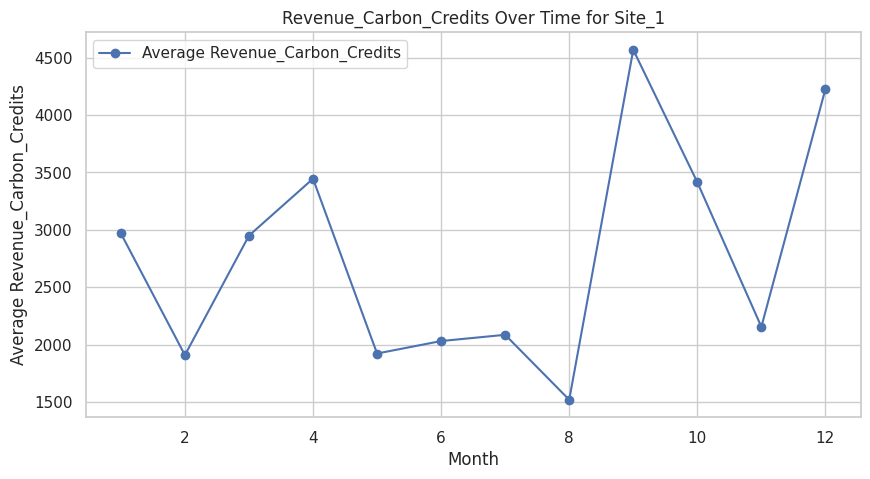

...

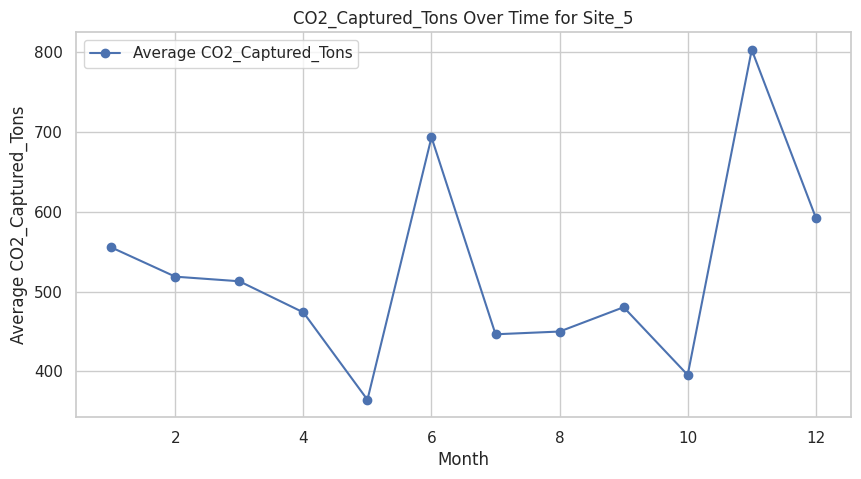

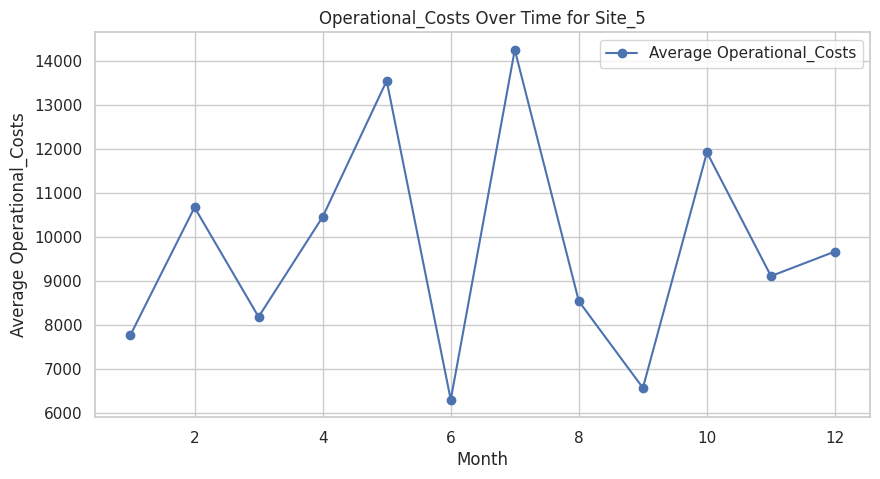

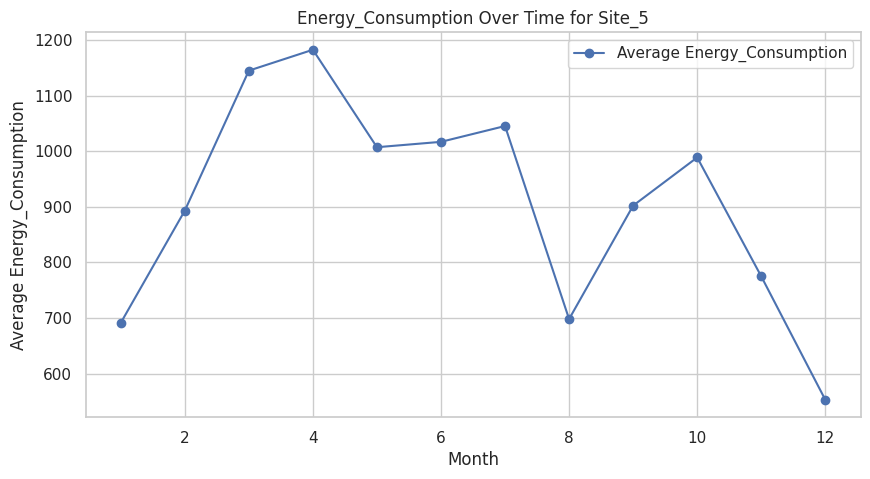

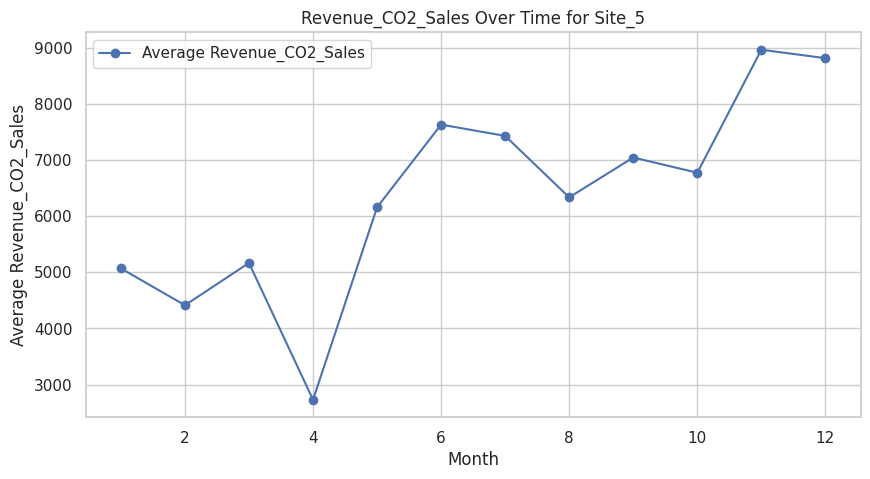

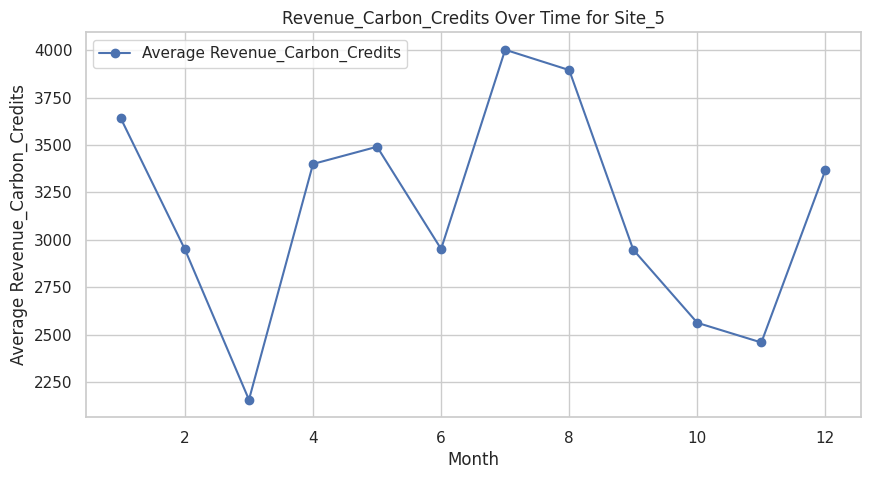

In [ ]:
# Cohort Analysis
# Group data by the month of the year to analyze seasonal patterns or cohort-specific performance changes.
# Add 'Month' column for cohort grouping
data['Month'] = data['Date'].dt.month

# Grouping by 'Month' and computing mean for each cohort across sites
cohort_data = data.groupby(['Site_ID', 'Month']).mean()

# Visualize the cohort analysis results
for site in data['Site_ID'].unique():
  for var in continuous_vars:
    plt.figure(figsize=(10, 5))
    cohort_site_data = cohort_data.loc[site]
    plt.plot(cohort_site_data[var], marker='o', label=f'Average {var}')
    plt.title(f'{var} Over Time for {site}')
    plt.xlabel('Month')
    plt.ylabel(f'Average {var}')
    plt.legend()
    plt.grid(True)
    plt.show()


## Correlation Analysis
•	Variable Relationships: Investigate the relationships between different variables, such as the correlation between the amount of CO2 captured and operational costs, to identify potential efficiency drivers.

•	Heatmaps: Use heatmaps to visually represent the correlation matrix, making it easier to spot highly correlated variables.


In [ ]:
# Select relevant columns
relevant_columns = ['CO2_Captured_Tons', 'Operational_Costs', 'Energy_Consumption', 'Revenue_CO2_Sales', 'Plant_Uptime_Percentage', 'Customer_Satisfaction_Score']
data_corr = data[relevant_columns]

In [ ]:
# Calculate correlation matrix
correlation_matrix = data_corr.corr()
print(correlation_matrix)


                             CO2_Captured_Tons  Operational_Costs  \
CO2_Captured_Tons                     1.000000           0.110592   
Operational_Costs                     0.110592           1.000000   
Energy_Consumption                   -0.101912           0.129158   
Revenue_CO2_Sales                    -0.032505          -0.147767   
Plant_Uptime_Percentage              -0.068635           0.050319   
Customer_Satisfaction_Score           0.105212           0.059595   

                             Energy_Consumption  Revenue_CO2_Sales  \
CO2_Captured_Tons                     -0.101912          -0.032505   
Operational_Costs                      0.129158          -0.147767   
Energy_Consumption                     1.000000          -0.147628   
Revenue_CO2_Sales                     -0.147628           1.000000   
Plant_Uptime_Percentage               -0.032858           0.102313   
Customer_Satisfaction_Score           -0.072627           0.059622   

                         

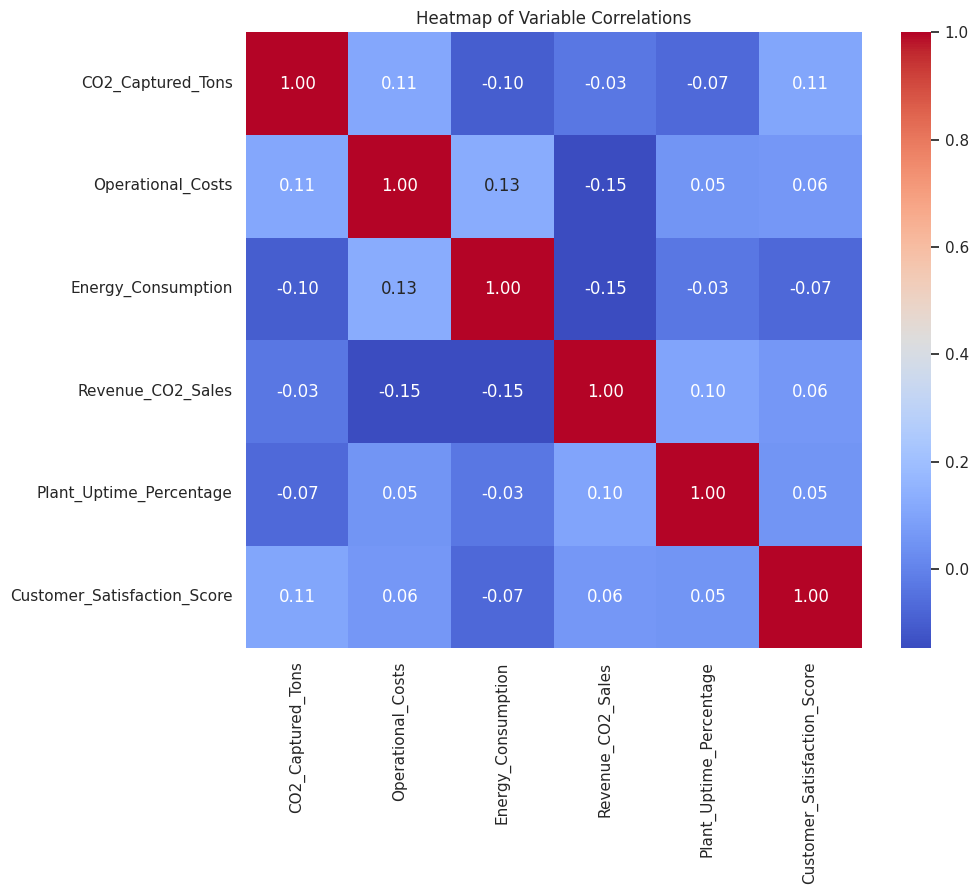

In [ ]:
# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True)
plt.title('Heatmap of Variable Correlations')
plt.show()


In [ ]:
# Group data by 'Site_ID' and calculate correlation matrix for each group
site_wise_correlations = data.groupby('Site_ID')[relevant_columns].corr()

# Print the correlation matrix for each site
for site_id, correlation_matrix in site_wise_correlations.groupby(level=0):
    print(f"Correlation matrix for Site {site_id}:")
    print(correlation_matrix)
    print("\n")  # Adds a newline for better readability between site outputs


Correlation matrix for Site Site_1:
                                     CO2_Captured_Tons  Operational_Costs  \
Site_ID                                                                     
Site_1  CO2_Captured_Tons                     1.000000          -0.171670   
        Operational_Costs                    -0.171670           1.000000   
        Energy_Consumption                   -0.097863           0.017597   
        Revenue_CO2_Sales                    -0.224393          -0.004973   
        Plant_Uptime_Percentage              -0.077255           0.147080   
        Customer_Satisfaction_Score           0.238925           0.264730   

                                     Energy_Consumption  Revenue_CO2_Sales  \
Site_ID                                                                      
Site_1  CO2_Captured_Tons                     -0.097863          -0.224393   
        Operational_Costs                      0.017597          -0.004973   
        Energy_Consumption         

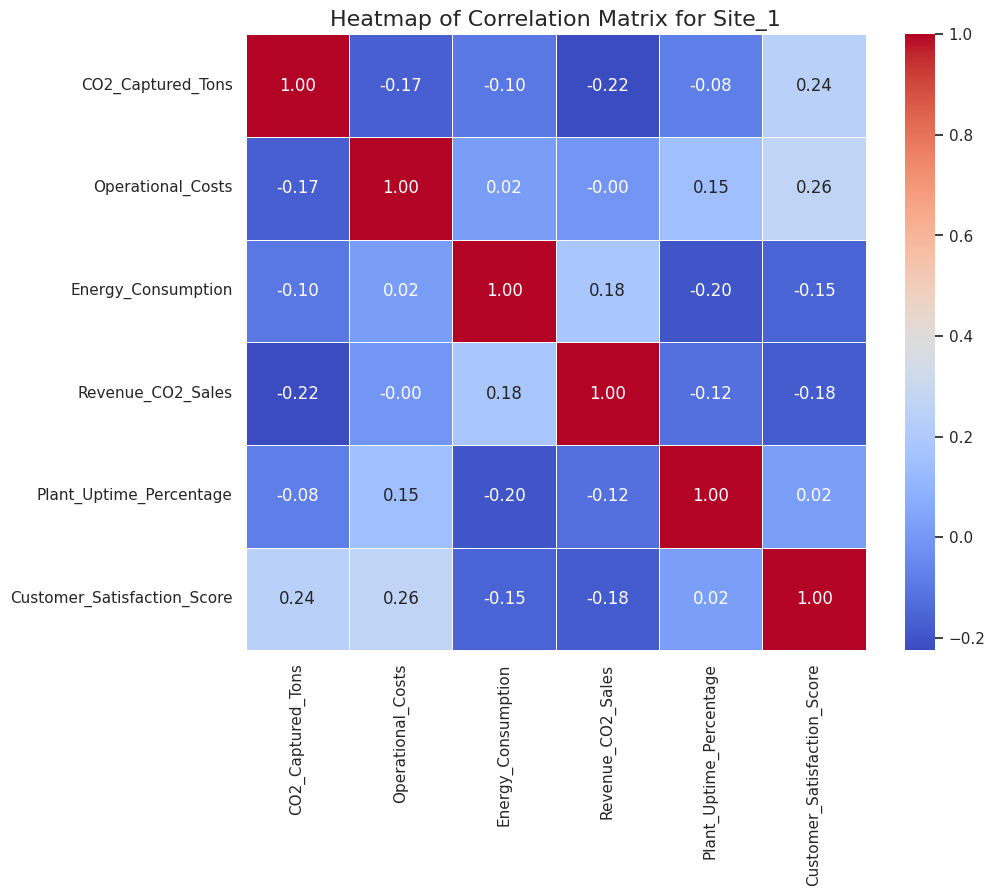

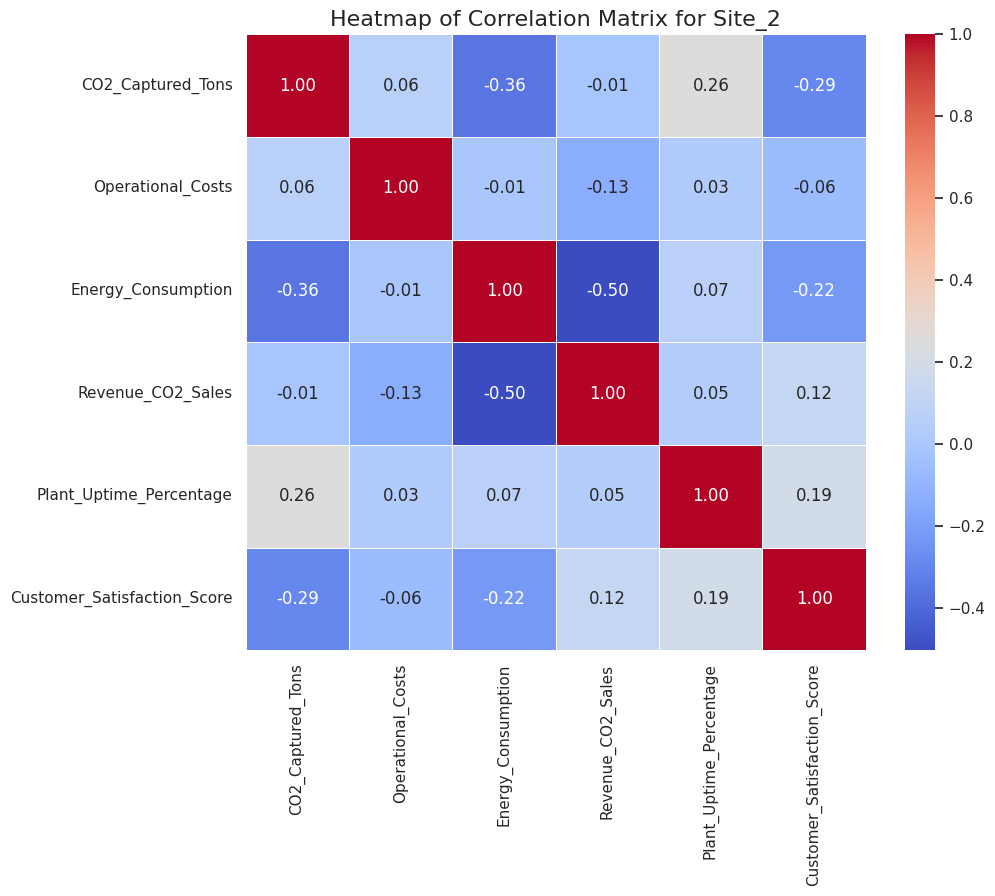

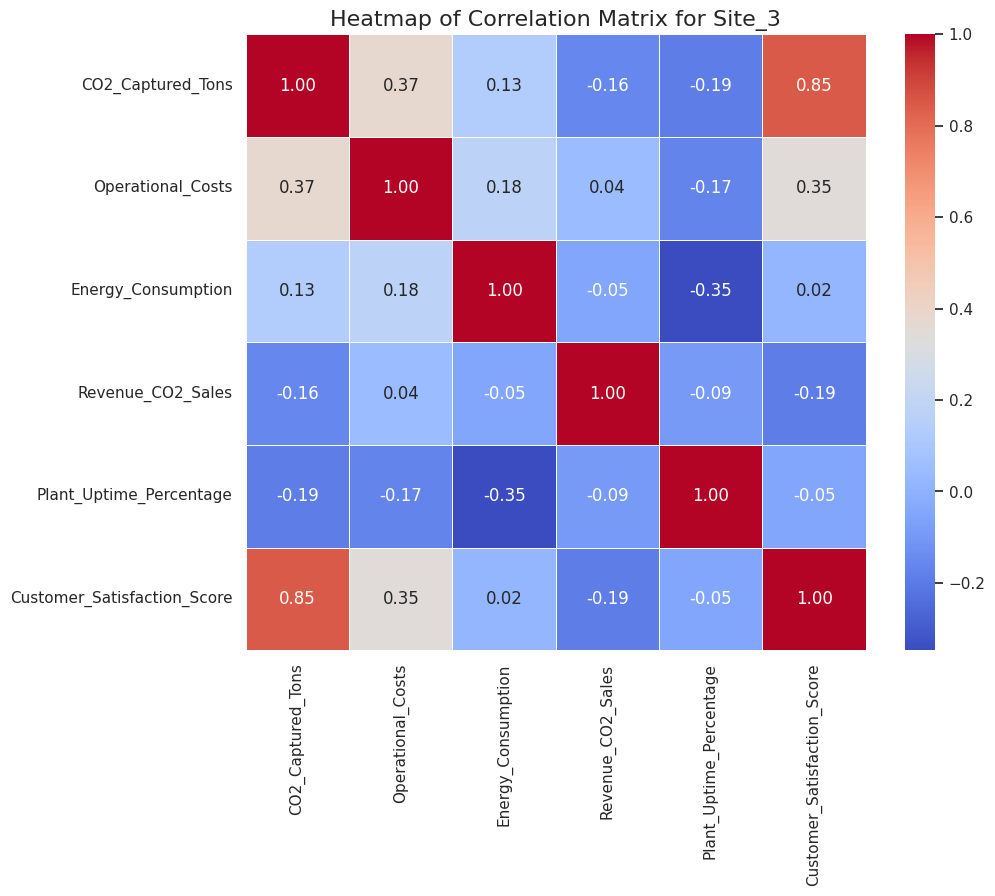

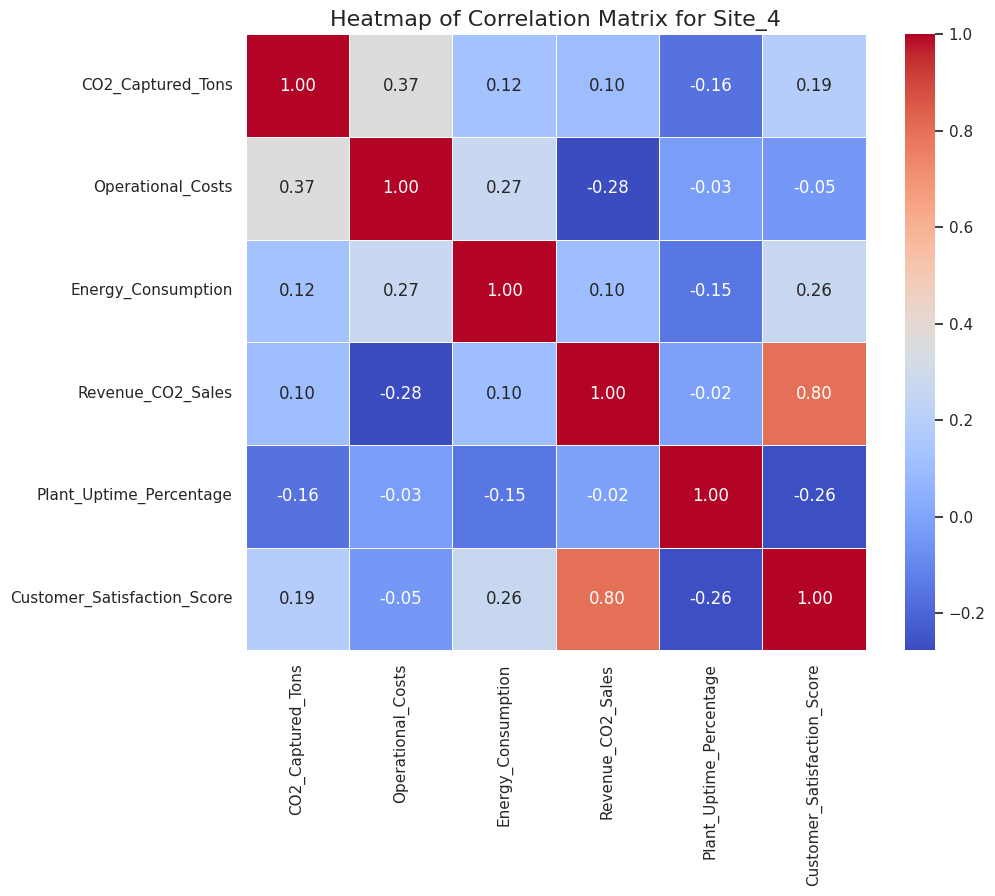

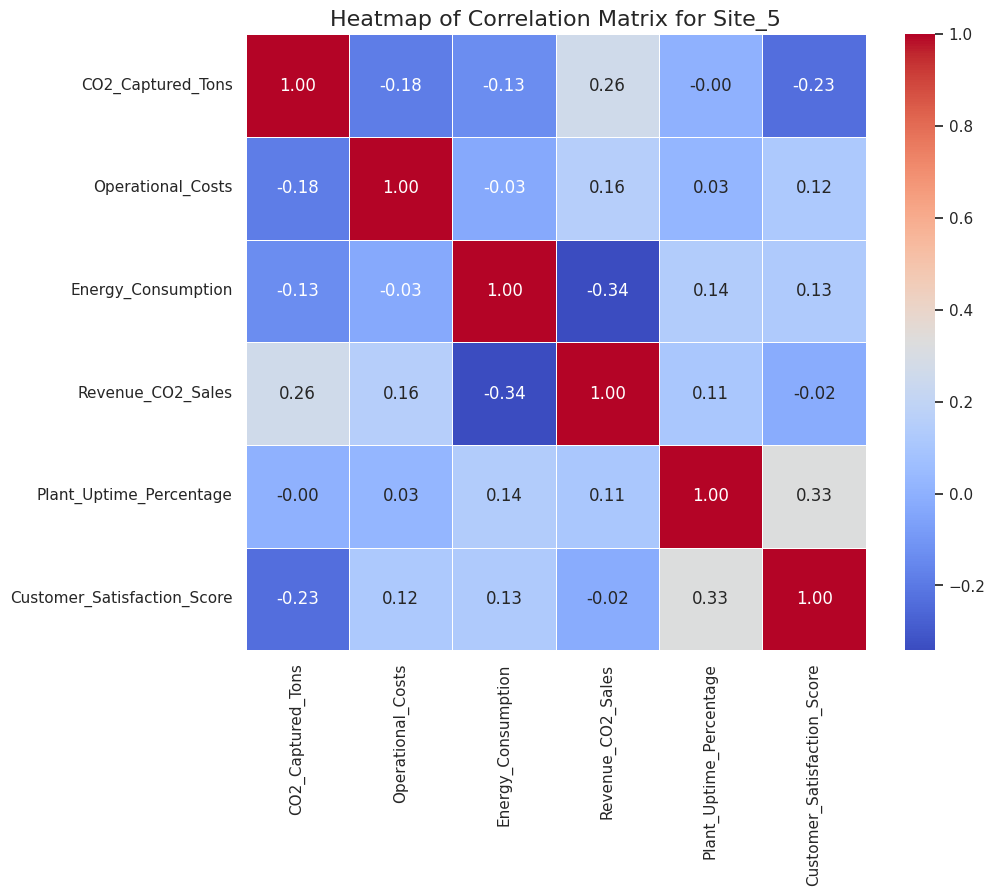

In [ ]:


# Assuming 'data' is your DataFrame and it contains a 'Site_ID' column
# You've already selected relevant columns and calculated the correlation matrix for each site

# Group data by 'Site_ID' and calculate correlation matrix for each group
site_wise_correlations = data.groupby('Site_ID')[relevant_columns].corr()

# Get unique site IDs
unique_sites = data['Site_ID'].unique()

# Plotting heatmaps for each site
for site in unique_sites:
    plt.figure(figsize=(10, 8))  # Set the figure size
    plt.title(f"Heatmap of Correlation Matrix for {site}", fontsize=16)  # Title for the heatmap

    # Extract the correlation matrix for the current site
    correlation_matrix = site_wise_correlations.loc[site]

    # Use seaborn to create the heatmap
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)

    # Show the plot
    plt.show()


## Operational Efficiency Analysis
•	Process Optimization: Analyze operational data to identify bottlenecks or inefficiencies in the carbon capture process.

•	Capacity Utilization: Evaluate how effectively the carbon capture infrastructure is being used and identify opportunities for optimization.


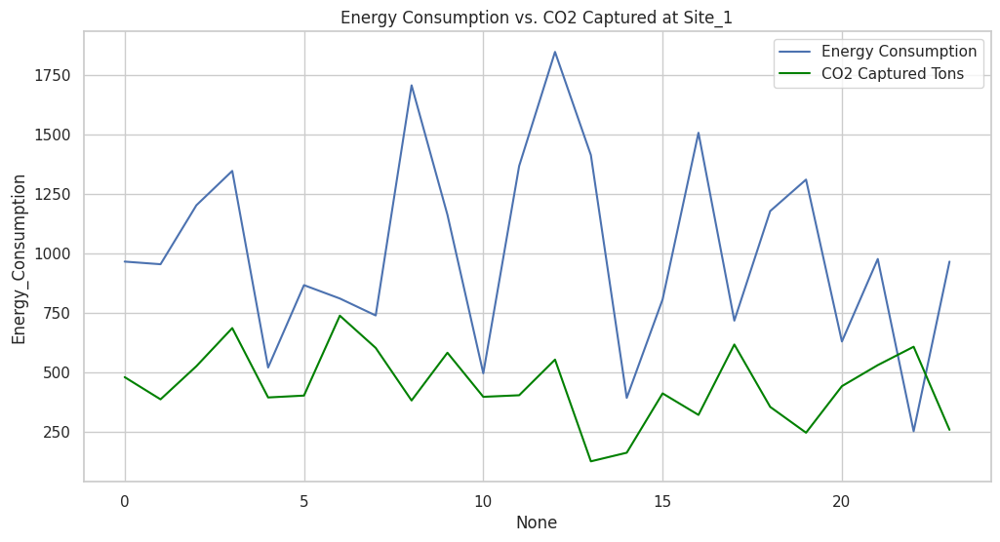

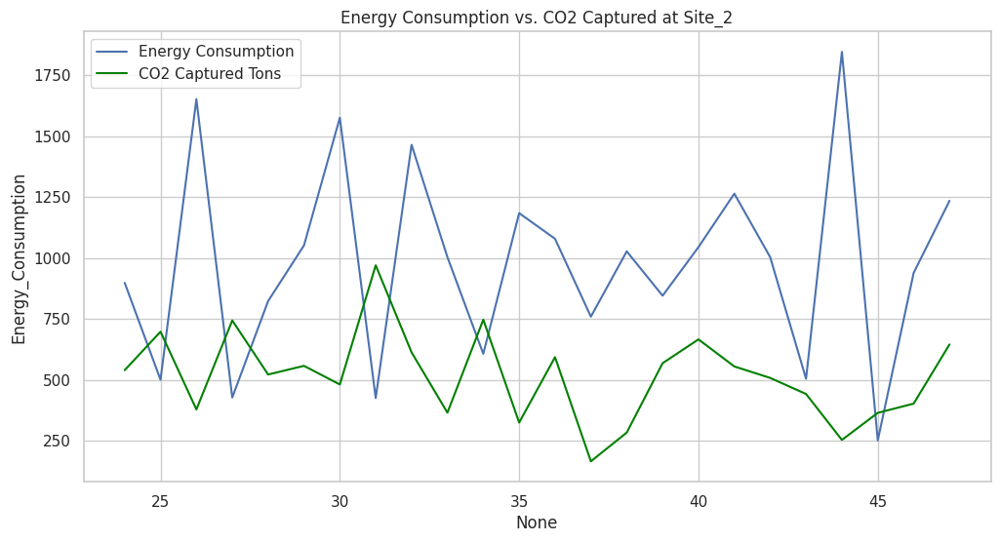

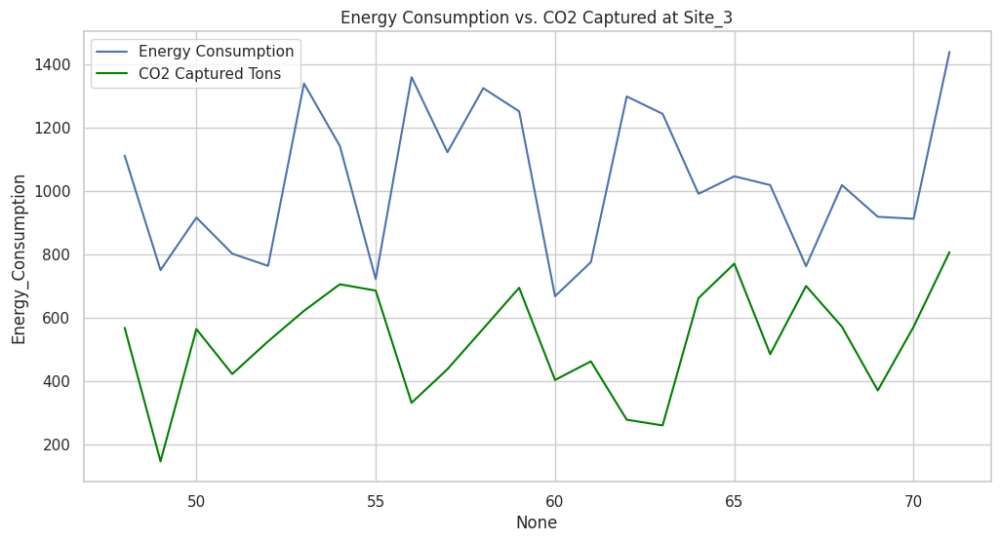

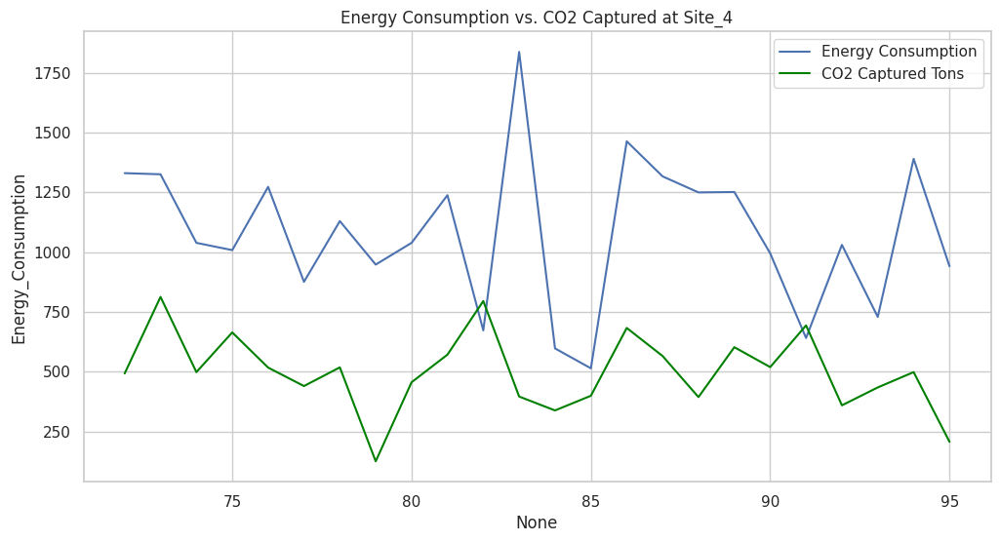

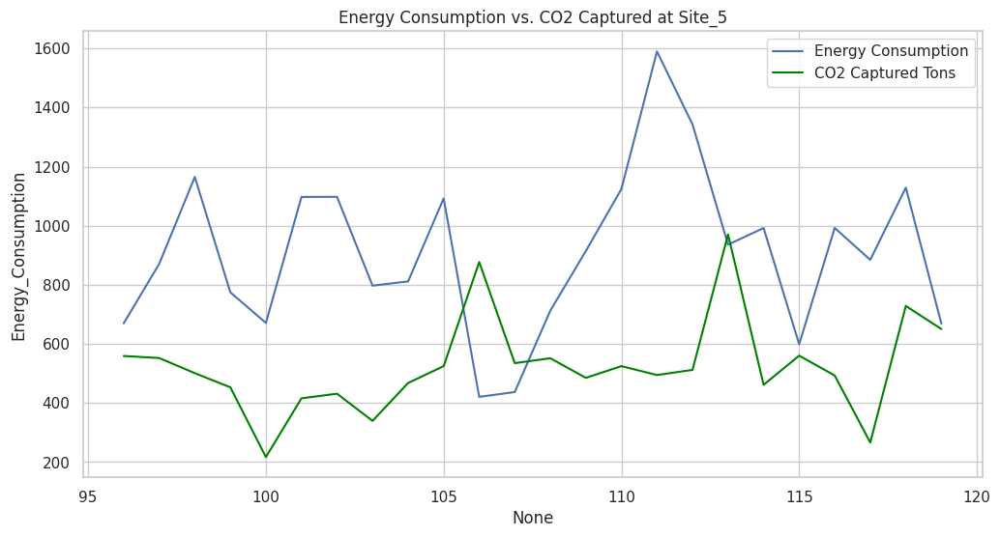

In [ ]:
for site in data['Site_ID'].cat.categories:
    site_data = data[data['Site_ID'] == site]
    plt.figure(figsize=(12, 6))
    plt.title(f'Energy Consumption vs. CO2 Captured at {site}')
    sns.lineplot(data=site_data, x=site_data.index, y='Energy_Consumption', label='Energy Consumption')
    sns.lineplot(data=site_data, x=site_data.index, y='CO2_Captured_Tons', label='CO2 Captured Tons', color='green')
    plt.legend()
    plt.show()



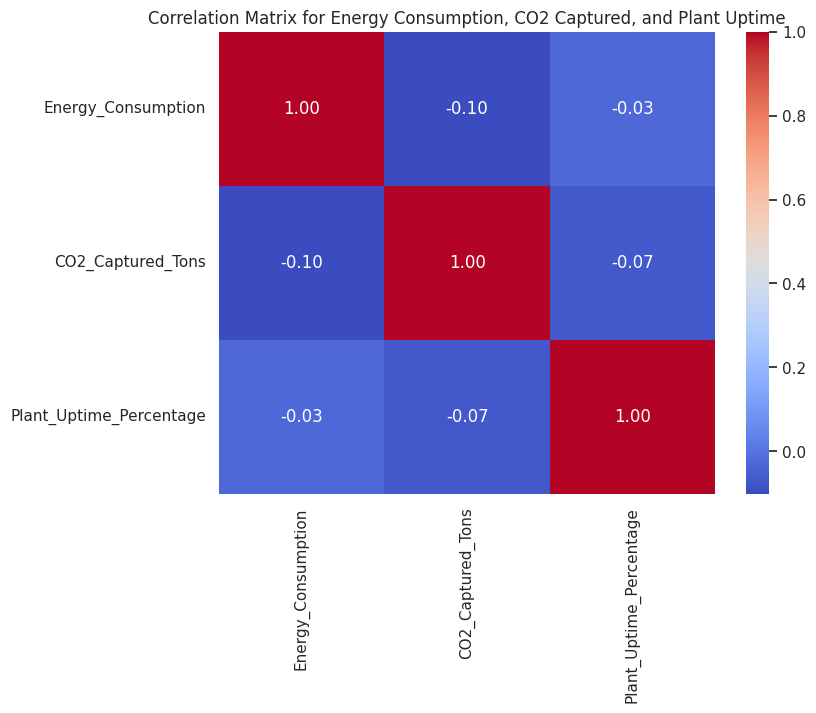

In [ ]:

# Define the necessary metrics
metrics = ['Energy_Consumption', 'CO2_Captured_Tons', 'Plant_Uptime_Percentage']

# Calculate correlation matrix
correlation_matrix = data[metrics].corr()

# Plotting the correlation matrix using a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix for Energy Consumption, CO2 Captured, and Plant Uptime')
plt.show()


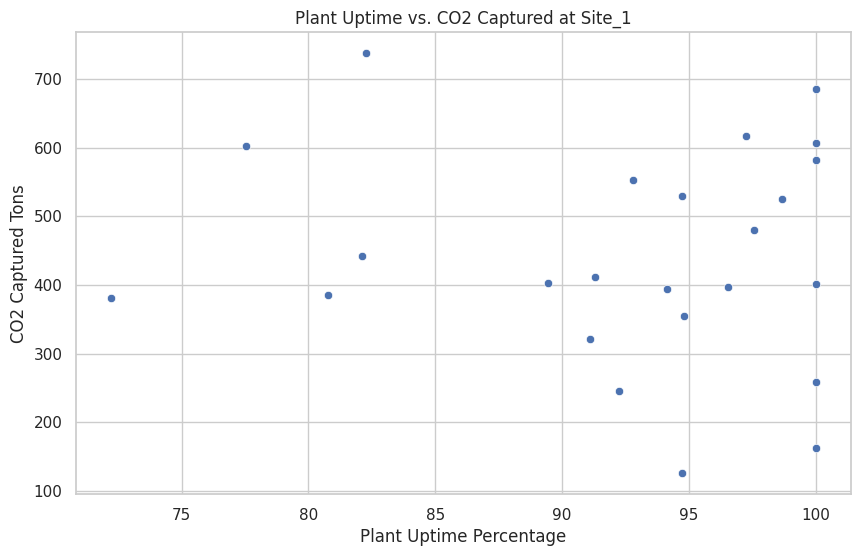

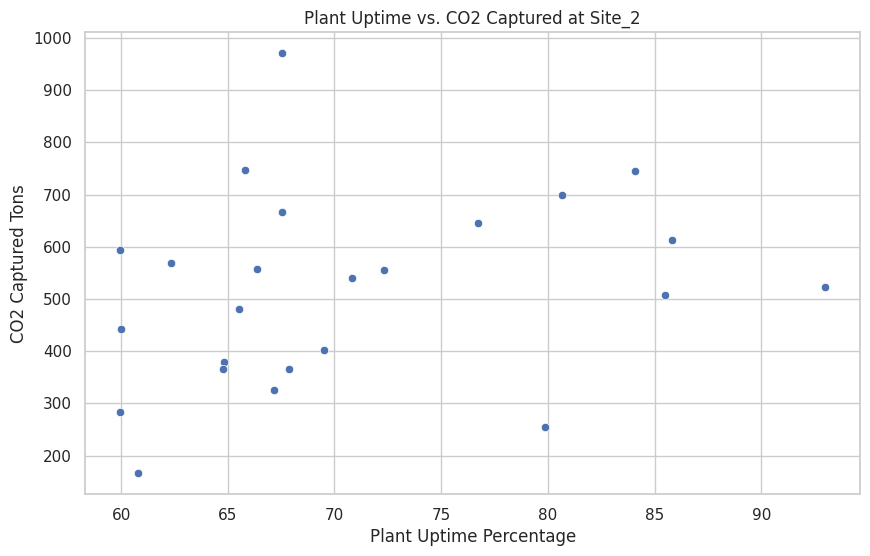

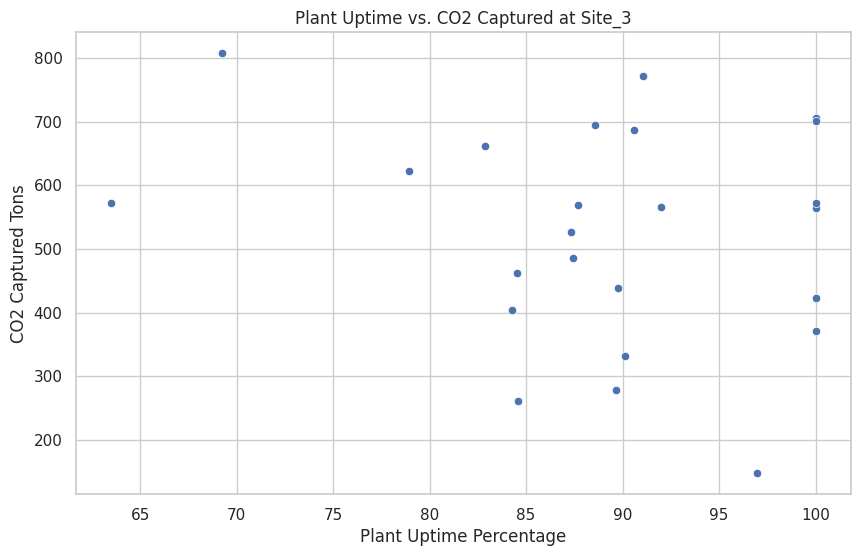

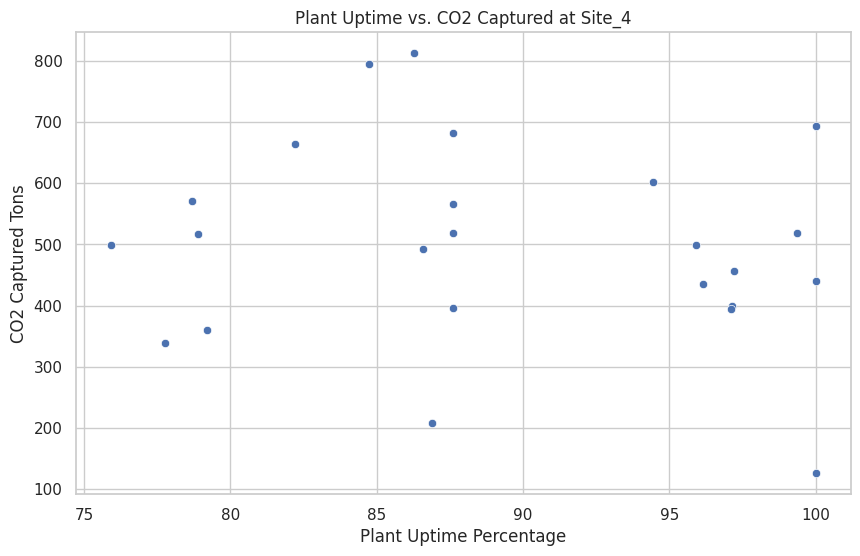

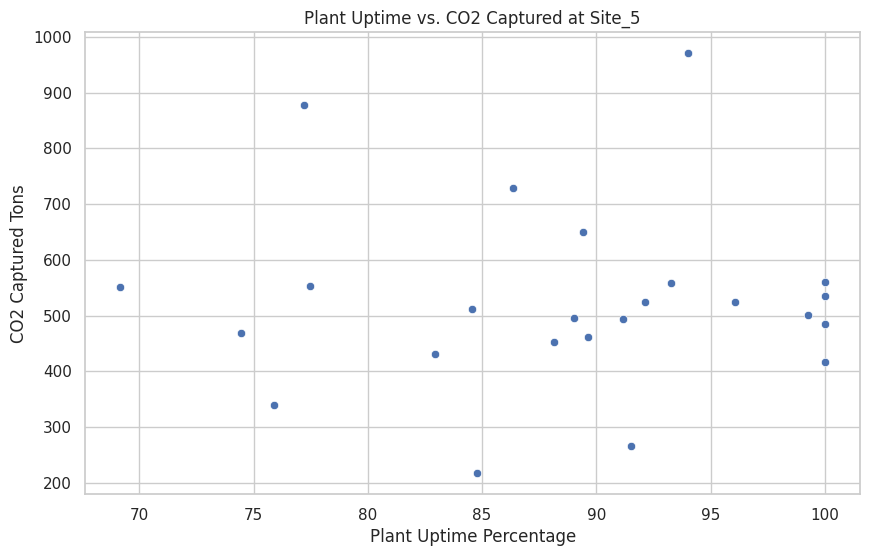

In [ ]:
for site in data['Site_ID'].cat.categories:
    site_data = data[data['Site_ID'] == site]

    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='Plant_Uptime_Percentage', y='CO2_Captured_Tons', data=site_data)
    plt.title(f'Plant Uptime vs. CO2 Captured at {site}')
    plt.xlabel('Plant Uptime Percentage')
    plt.ylabel('CO2 Captured Tons')
    plt.show()


## Financial Performance Analysis
•	Cost-Benefit Analysis: Assess the financial viability of CCaaS projects by comparing the costs (both operational and capital) against the benefits, including revenue from CO2 sales and carbon credits.

•	ROI Analysis: Calculate the return on investment for different projects to identify the most financially viable options.


In [ ]:
# Example, assuming capital costs are amortized monthly and included as a column or calculated elsewhere
data['Total_Costs'] = data['Operational_Costs'] + data.get('Capital_Costs', 0)
data['Total_Benefits'] = data['Revenue_CO2_Sales'] + data['Revenue_Carbon_Credits']

# Calculate net benefits
data['Net_Benefits'] = data['Total_Benefits'] - data['Total_Costs']


In [ ]:
data['ROI'] = (data['Net_Benefits'] / data['Total_Costs']) * 100


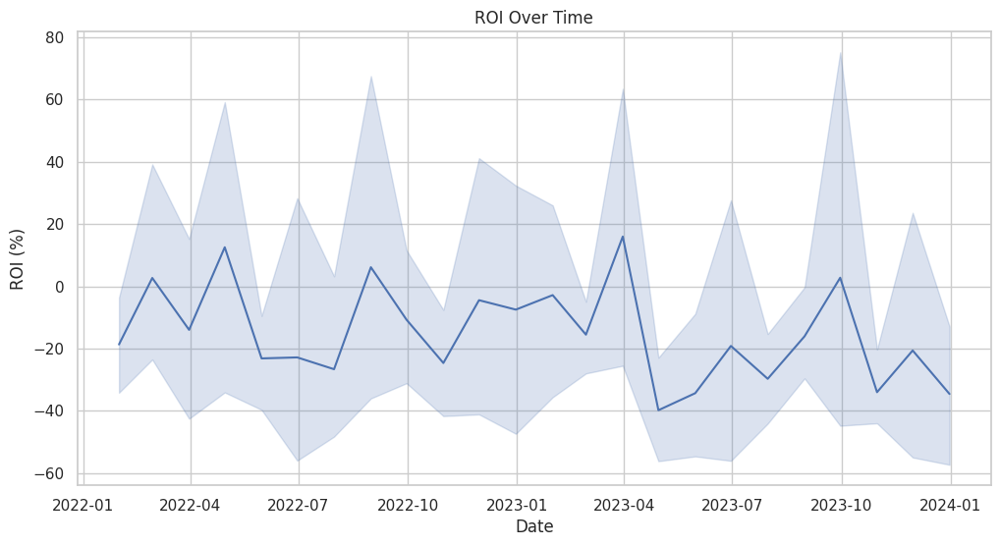

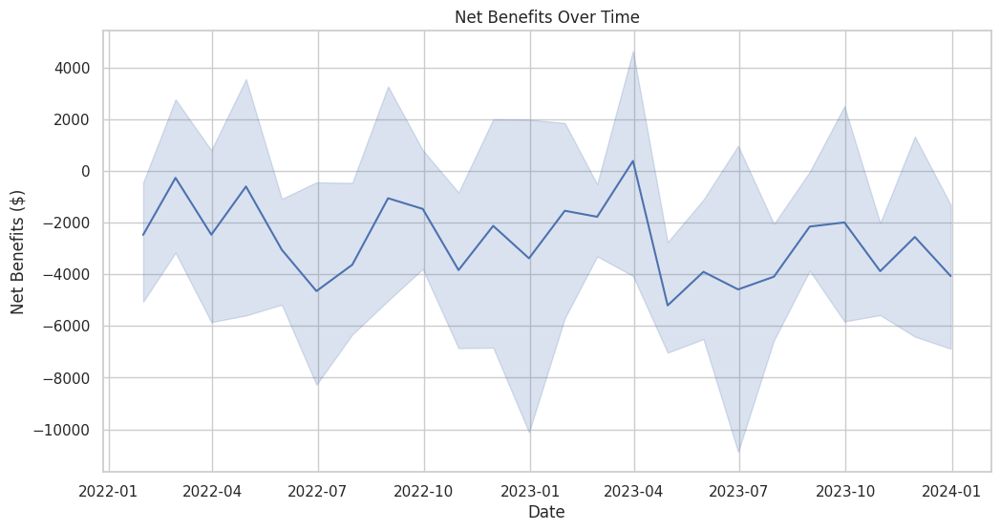

In [ ]:

# Plotting ROI over time
plt.figure(figsize=(12, 6))
sns.lineplot(data=data, x='Date', y='ROI')
plt.title('ROI Over Time')
plt.ylabel('ROI (%)')
plt.xlabel('Date')
plt.grid(True)
plt.show()

# Plotting Net Benefits over time
plt.figure(figsize=(12, 6))
sns.lineplot(data=data, x='Date', y='Net_Benefits')
plt.title('Net Benefits Over Time')
plt.ylabel('Net Benefits ($)')
plt.xlabel('Date')
plt.grid(True)
plt.show()


In [ ]:
# Group by Site ID and calculate average ROI and Net Benefits
grouped_data = data.groupby('Site_ID').agg({'ROI': 'mean', 'Net_Benefits': 'mean'})

# Displaying grouped data
print(grouped_data)


               ROI  Net_Benefits
Site_ID                         
Site_1    6.625480   -322.963296
Site_2  -21.238072  -2709.061049
Site_3  -30.762384  -4339.602811
Site_4  -39.298826  -5833.780582
Site_5    9.908300   -214.553437


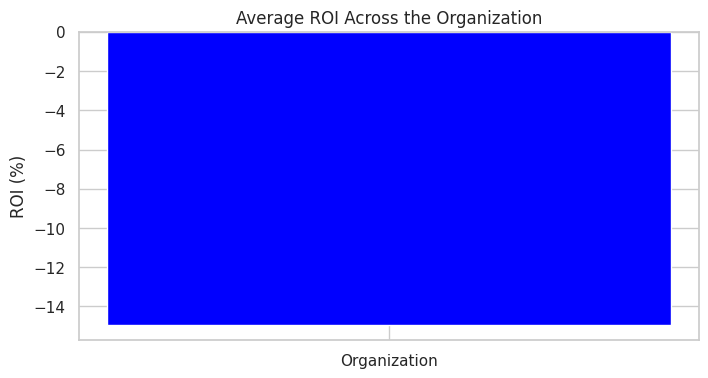

In [ ]:
# Calculating the average ROI across the organization
average_roi = data['ROI'].mean()

# Visualizing Organization Level ROI
plt.figure(figsize=(8, 4))
plt.bar('Organization', average_roi, color='blue')
plt.title('Average ROI Across the Organization')
plt.ylabel('ROI (%)')
plt.show()


<ipython-input-85-5cbd8f950963>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Site_ID', y='ROI', data=site_roi, palette='viridis')  # Corrected palette name


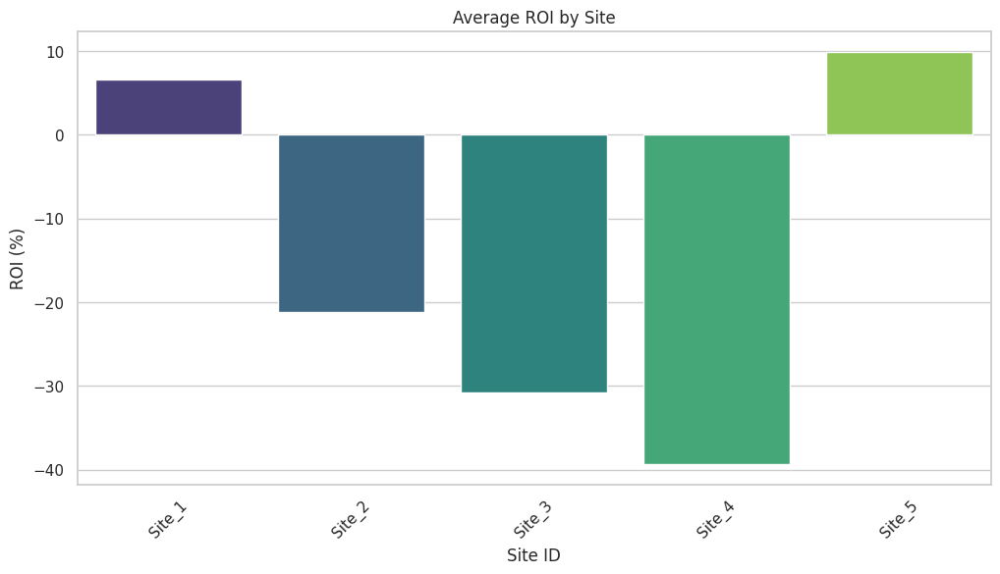

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Group data by site and calculate average ROI for each site
site_roi = data.groupby('Site_ID')['ROI'].mean().reset_index()

# Visualizing Site Level ROI
plt.figure(figsize=(12, 6))
sns.barplot(x='Site_ID', y='ROI', data=site_roi, palette='viridis')  # Corrected palette name
plt.title('Average ROI by Site')
plt.xlabel('Site ID')
plt.ylabel('ROI (%)')
plt.xticks(rotation=45)
plt.show()


<ipython-input-86-409461520968>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Site_ID', y='ROI', data=site_roi, palette='viridis', ax=ax[1])  # Use a correct palette name


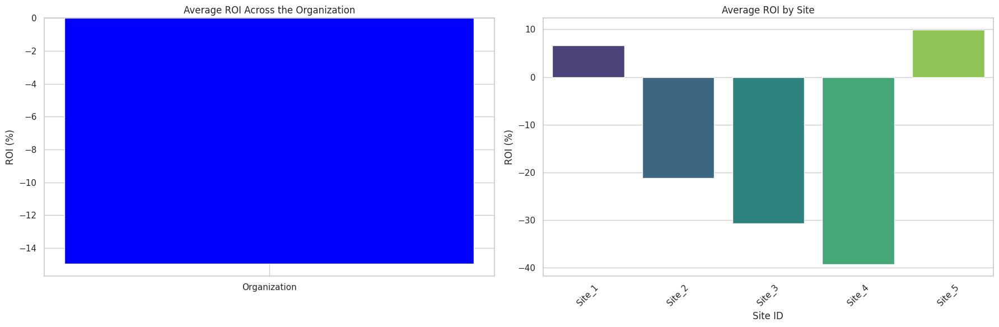

In [ ]:
# Combined plot
fig, ax = plt.subplots(1, 2, figsize=(18, 6))

# Calculate the average ROI across the organization
average_roi = data['ROI'].mean()

# Organization level
ax[0].bar('Organization', average_roi, color='blue')
ax[0].set_title('Average ROI Across the Organization')
ax[0].set_ylabel('ROI (%)')

# Site level
sns.barplot(x='Site_ID', y='ROI', data=site_roi, palette='viridis', ax=ax[1])  # Use a correct palette name
ax[1].set_title('Average ROI by Site')
ax[1].set_xlabel('Site ID')
ax[1].set_ylabel('ROI (%)')
ax[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


## Geospatial Analysis (if applicable)
•	Location Efficiency: For projects spread across multiple locations, analyze geographical data to understand the impact of location on operational and financial performance.


In [ ]:

# Hypothetical location data for 5 sites
location_data = {
    'Site_ID': ['Site_1', 'Site_2', 'Site_3', 'Site_4', 'Site_5'],
    'Latitude': [34.0522, 36.7783, 40.7128, 39.7392, 37.7749],
    'Longitude': [-118.2437, -119.4179, -74.0060, -104.9903, -122.4194]
}

# Convert dictionary to DataFrame
location_df = pd.DataFrame(location_data)

# Display the DataFrame
location_df


,Site_ID,Latitude,Longitude
0,Site_1,34.0522,-118.2437
1,Site_2,36.7783,-119.4179
2,Site_3,40.7128,-74.0060
3,Site_4,39.7392,-104.9903
4,Site_5,37.7749,-122.4194


In [ ]:
data = pd.merge(data, location_df, on='Site_ID')

<ipython-input-89-d0f2ba66b446>:10: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


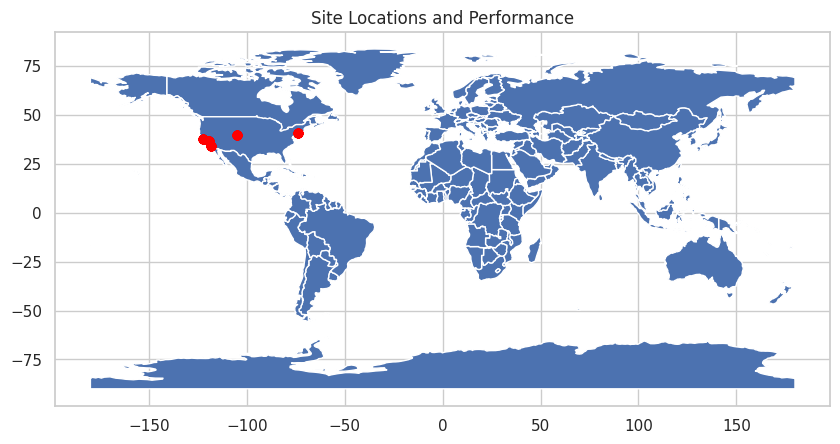

In [ ]:
import geopandas as gpd
from shapely.geometry import Point

# Convert DataFrame to GeoDataFrame
data['coordinates'] = list(zip(data['Longitude'], data['Latitude']))
data['coordinates'] = data['coordinates'].apply(Point)
gdf = gpd.GeoDataFrame(data, geometry='coordinates')

# Plotting
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
ax = world.plot(figsize=(10, 6))
gdf.plot(ax=ax, color='red')
plt.title('Site Locations and Performance')
plt.show()


In [ ]:
import folium

# Create a base map
map = folium.Map(location=[data['Latitude'].mean(), data['Longitude'].mean()], zoom_start=5)

# Add markers for each site
for idx, row in data.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']],
                  popup=f'Site: {row["Site_ID"]}\nROI: {row["ROI"]}').add_to(map)

map.save('map.html')


#	Environmental Impact Assessment:
•	Estimate the total CO2 emissions reduced by CCaaS implementation at each site.

•	Discuss the environmental benefits and potential for sustainability improvements.


In [ ]:
# Calculate the total CO2 emissions reduced by each site
total_co2_reduced = data.groupby('Site_ID')['CO2_Captured_Tons'].sum()

# Display the total CO2 emissions reduced by site
print("Total CO2 Emissions Reduced by Site:")
print(total_co2_reduced)

Total CO2 Emissions Reduced by Site:
Site_ID
Site_1    10602.530536
Site_2    12399.984251
Site_3    12626.249044
Site_4    11985.937667
Site_5    12573.007289
Name: CO2_Captured_Tons, dtype: float64


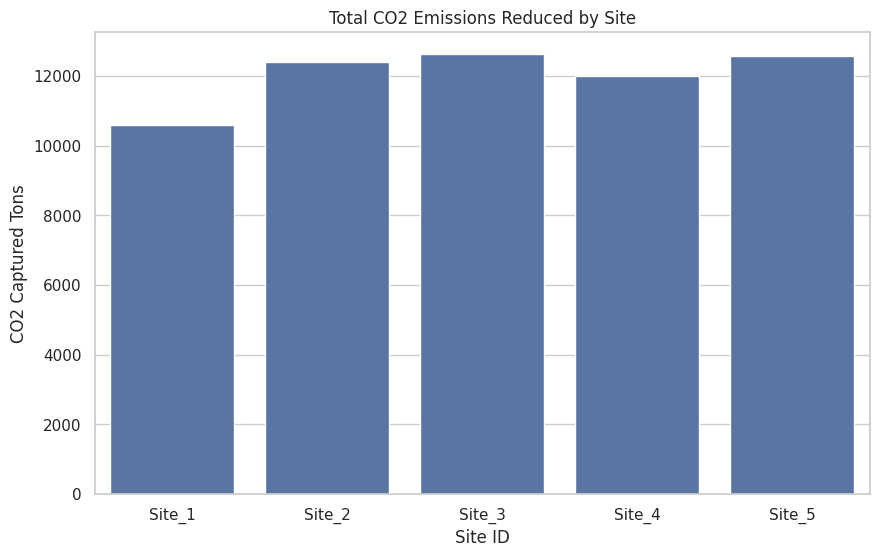

In [ ]:
# Visualize the total CO2 emissions reduced by each site
plt.figure(figsize=(10, 6))
sns.barplot(x=total_co2_reduced.index, y=total_co2_reduced.values)
plt.title('Total CO2 Emissions Reduced by Site')
plt.xlabel('Site ID')
plt.ylabel('CO2 Captured Tons')
plt.show()

#	Customer Satisfaction and Correlation Analysis:
•	Examine customer satisfaction scores across sites and explore correlations with operational or financial metrics.


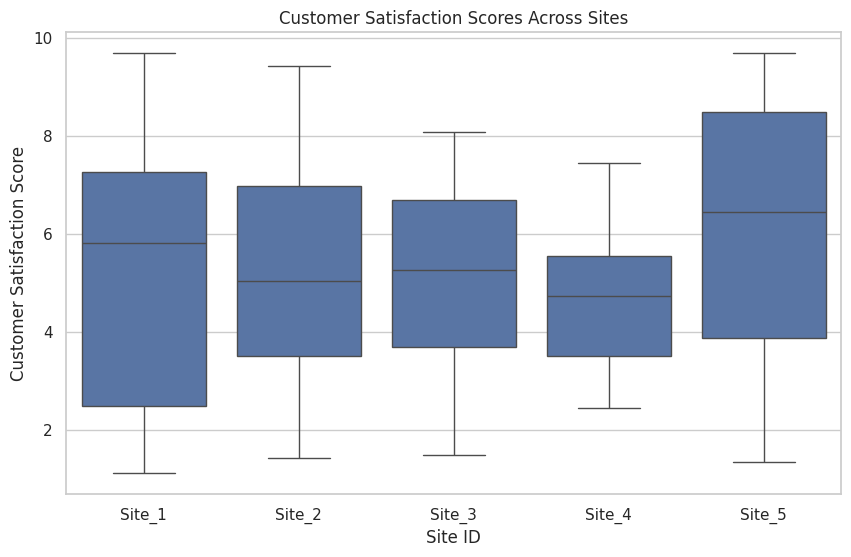

In [ ]:
# Basic Analysis of Customer Satisfaction
'''Start by examining the distribution of customer satisfaction scores across different sites. This gives a baseline understanding of how different sites perform in terms of customer satisfaction.'''
# Plotting customer satisfaction scores across sites
plt.figure(figsize=(10, 6))
sns.boxplot(x='Site_ID', y='Customer_Satisfaction_Score', data=data)
plt.title('Customer Satisfaction Scores Across Sites')
plt.xlabel('Site ID')
plt.ylabel('Customer Satisfaction Score')
plt.show()


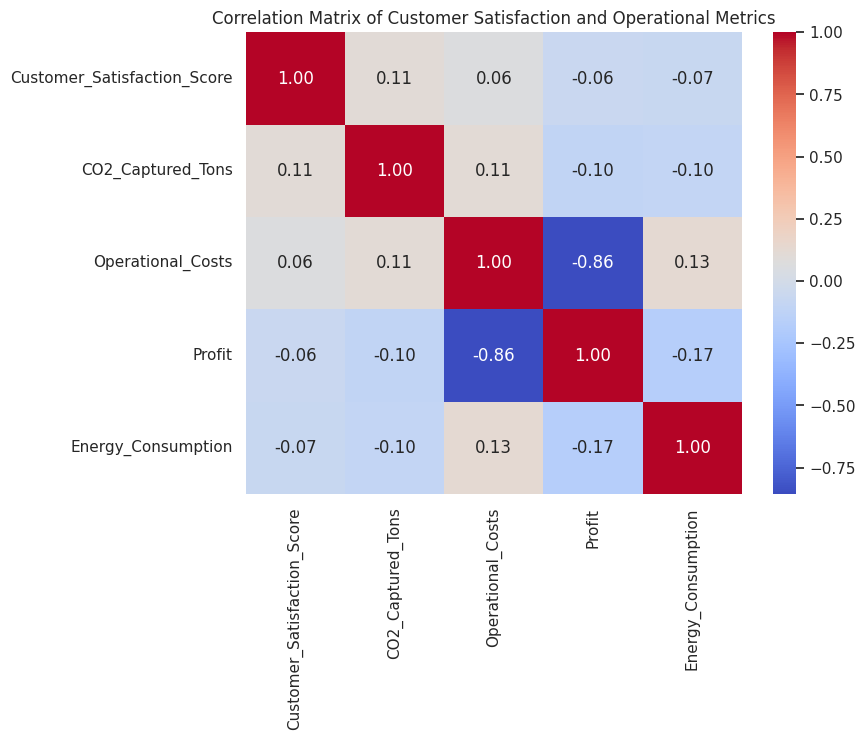

In [ ]:
# Correlation Analysis
'''Determine how customer satisfaction correlates with operational and financial metrics such as CO2 captured tons, operational costs, profit, and energy consumption. This can help identify drivers of customer satisfaction.'''

# Selecting relevant metrics for correlation
metrics = ['Customer_Satisfaction_Score', 'CO2_Captured_Tons', 'Operational_Costs', 'Profit', 'Energy_Consumption']

# Calculating the correlation matrix
correlation_matrix = data[metrics].corr()

# Creating a heatmap of the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Customer Satisfaction and Operational Metrics')
plt.show()


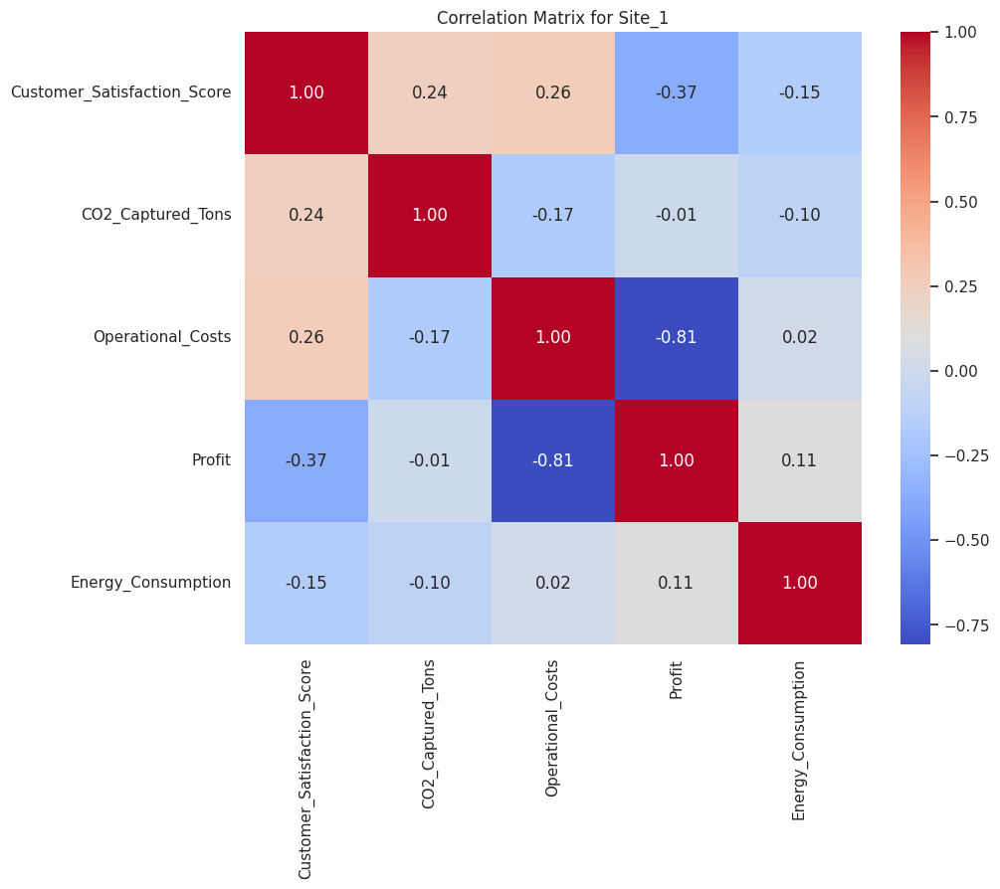

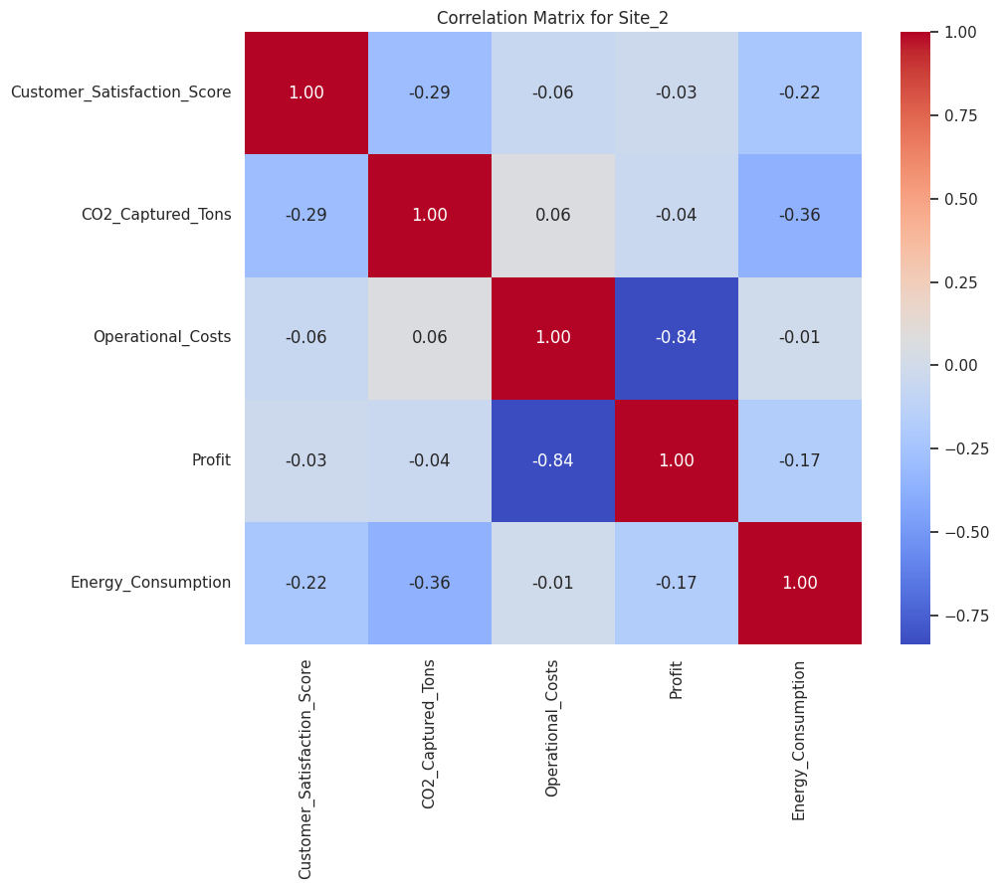

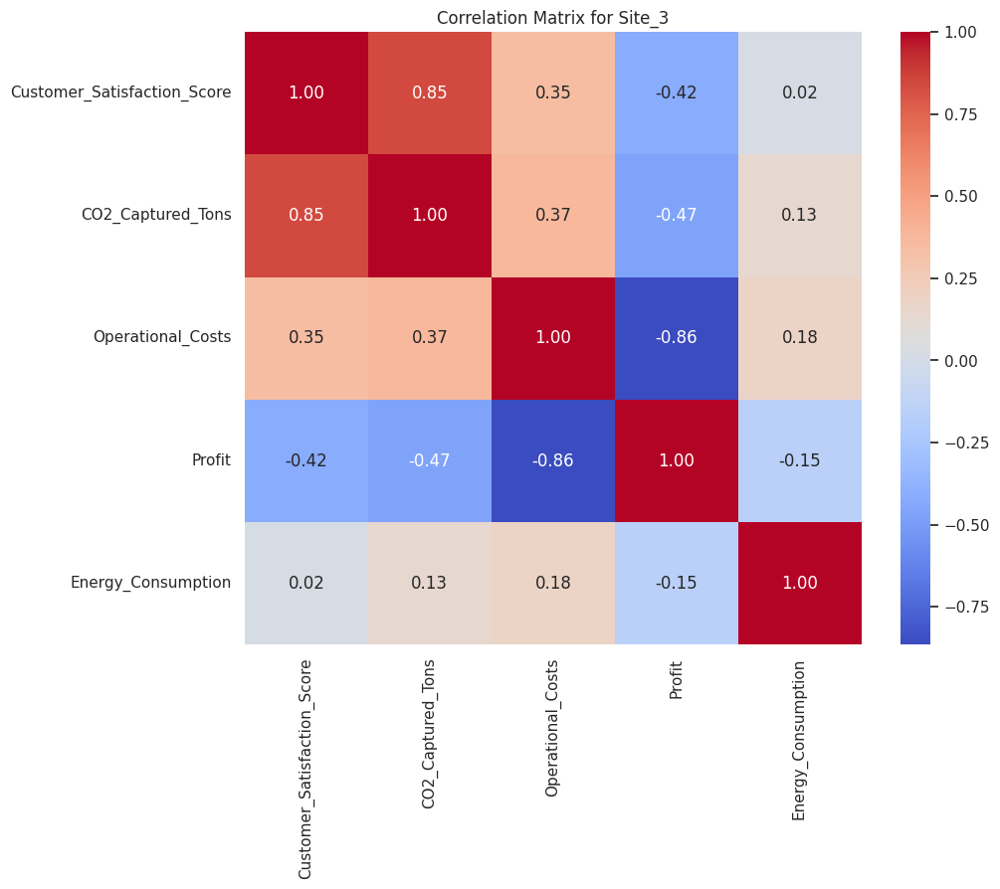

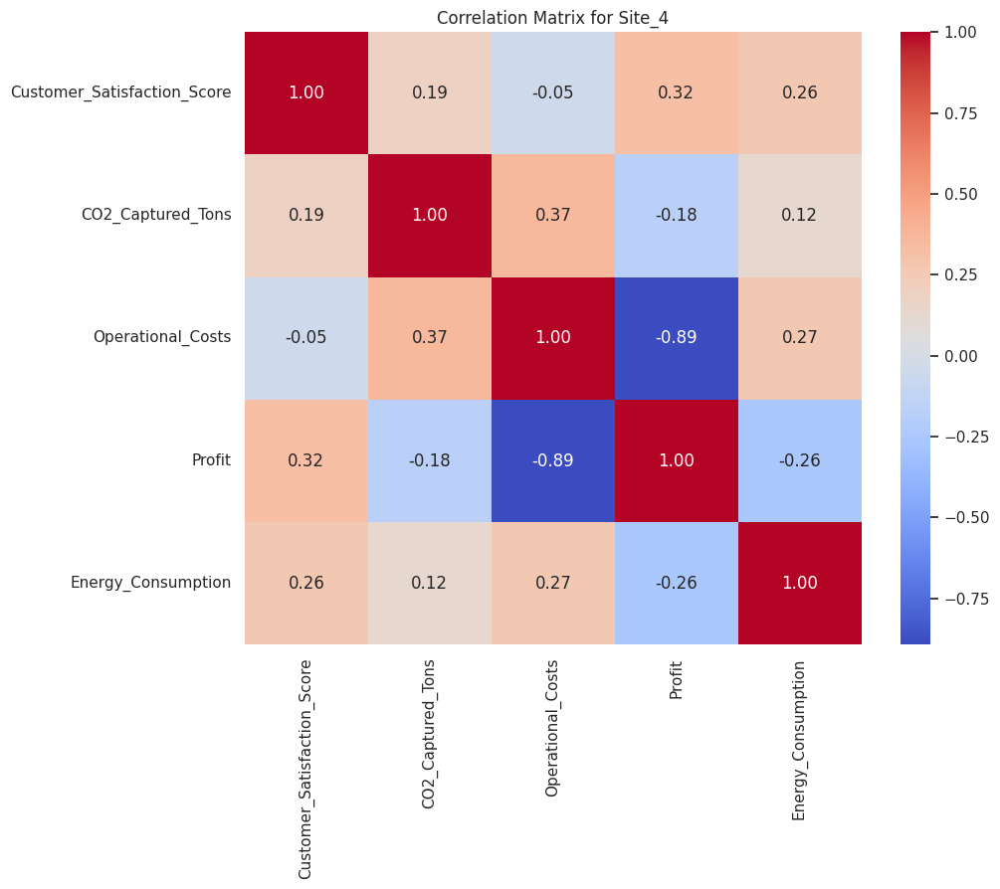

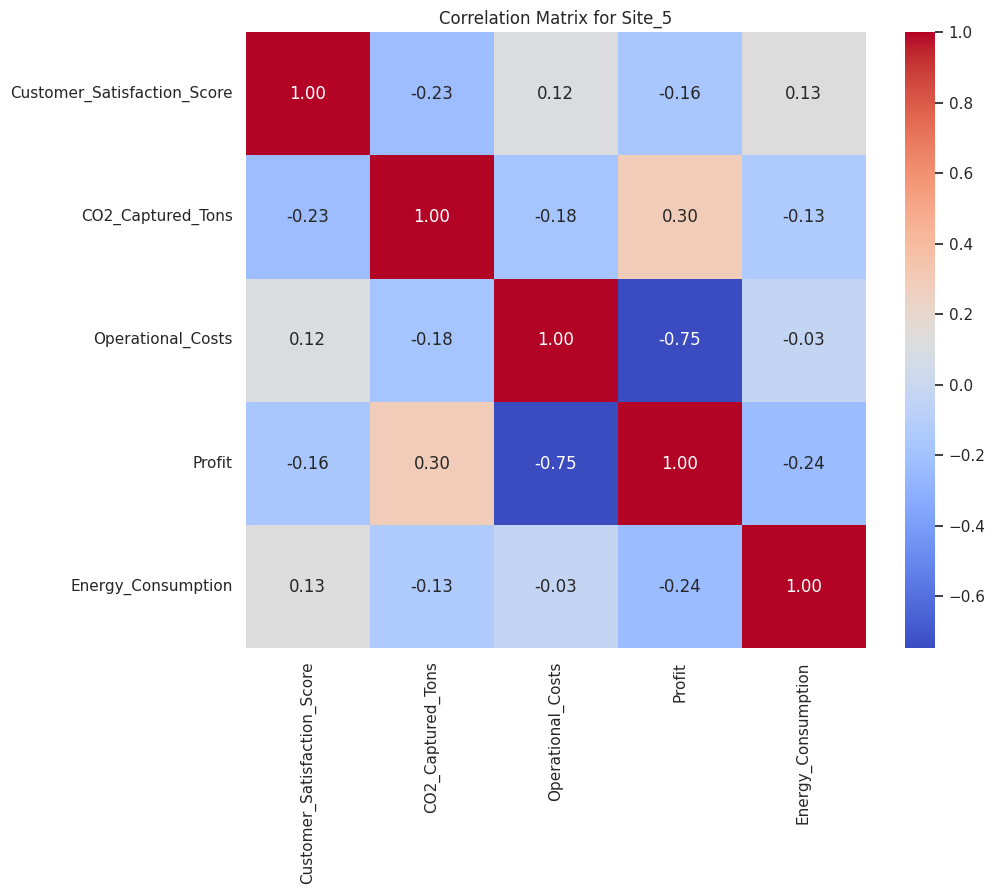

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Metrics to be included in the correlation analysis
metrics = ['Customer_Satisfaction_Score', 'CO2_Captured_Tons', 'Operational_Costs', 'Profit', 'Energy_Consumption']

# Sites to analyze
sites = data['Site_ID'].unique()

for site in sites:
    plt.figure(figsize=(10, 8))
    site_data = data[data['Site_ID'] == site]

    # Calculate the correlation matrix for the selected site
    correlation_matrix = site_data[metrics].corr()

    # Plotting the correlation matrix using a heatmap
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
    plt.title(f'Correlation Matrix for {site}')
    plt.show()


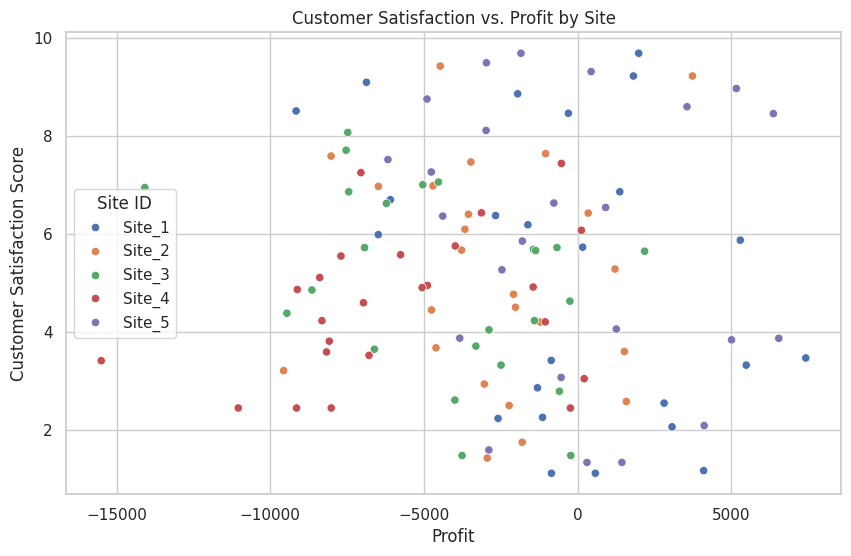

In [ ]:
# Detailed Analysis
'''Based on the correlation analysis, investigate any significant correlations.
For example, if customer satisfaction is highly correlated with profit or CO2 captured tons,
 further detailed analysis may be needed to understand the causality and implications of these relationships.'''

 # Explore detailed trends if significant correlations are found
#if correlation_matrix.loc['Customer_Satisfaction_Score', 'Profit'] > 0.1:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Profit', y='Customer_Satisfaction_Score', hue='Site_ID', data=data)
plt.title('Customer Satisfaction vs. Profit by Site')
plt.xlabel('Profit')
plt.ylabel('Customer Satisfaction Score')
plt.legend(title='Site ID')
plt.show()



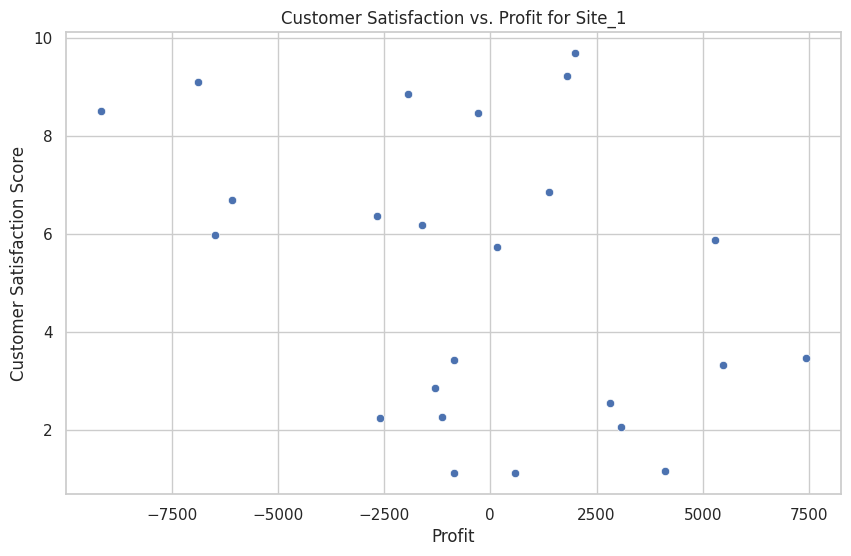

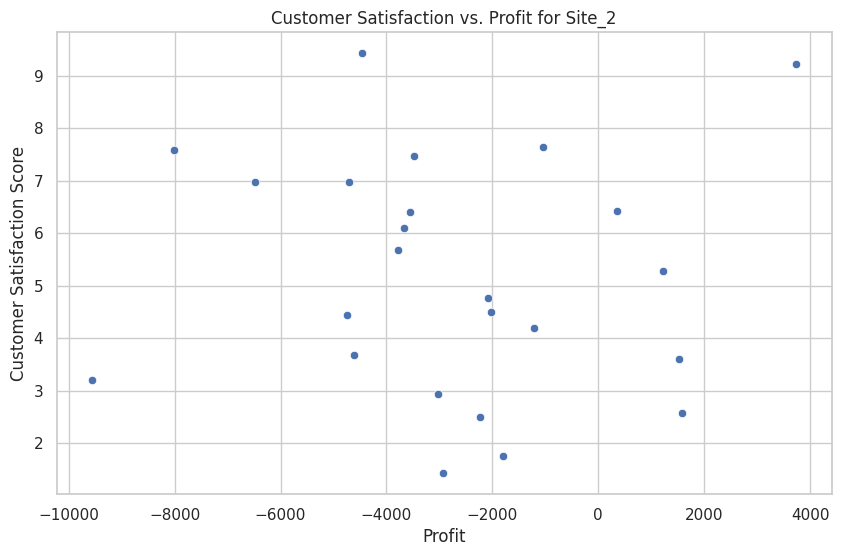

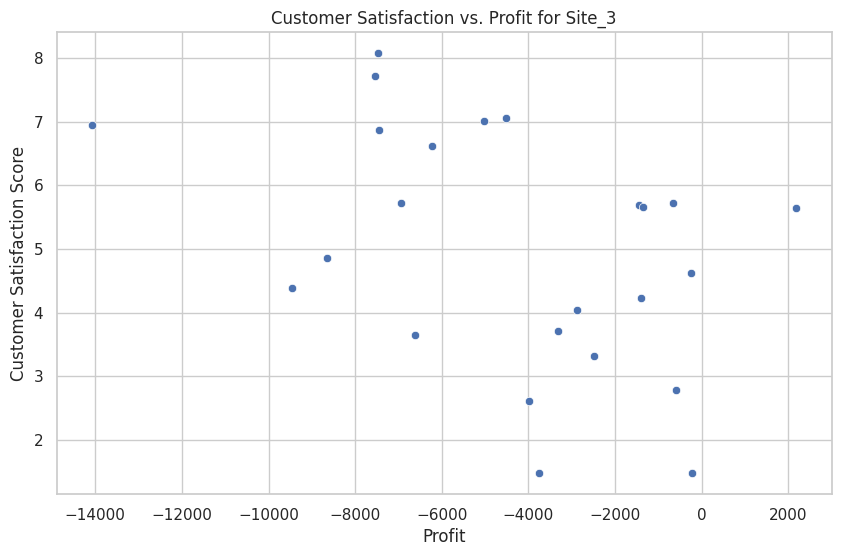

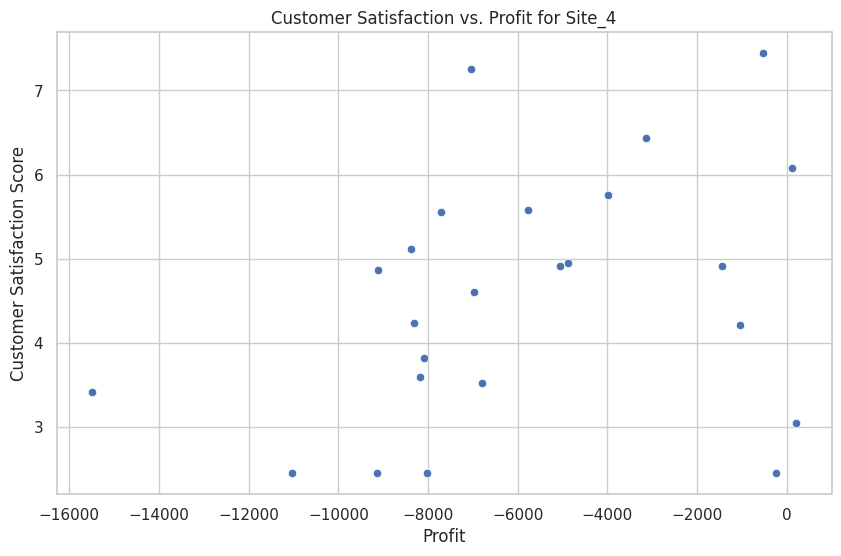

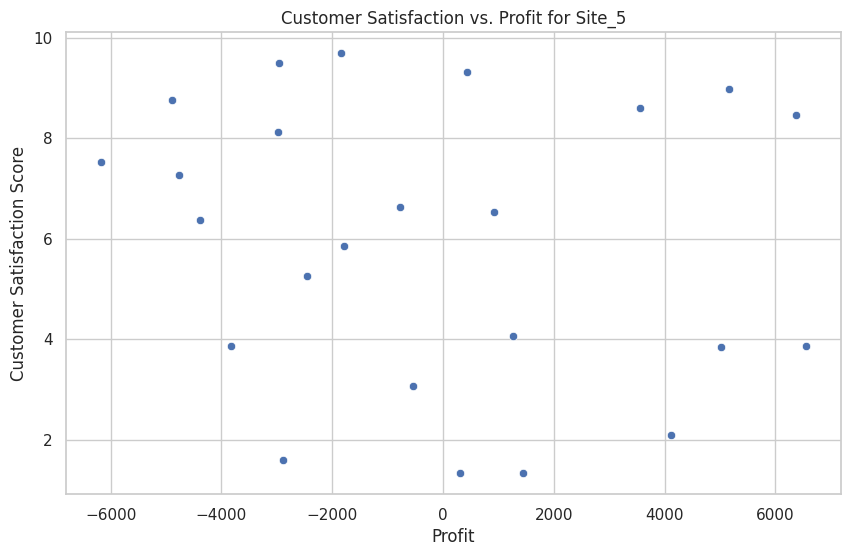

In [ ]:
# Define the sites
sites = data['Site_ID'].unique()

for site in sites:
    # Select data for the current site
    site_data = data[data['Site_ID'] == site]

    # Calculate correlation matrix for the site-specific data
    correlation_matrix = site_data[['Customer_Satisfaction_Score', 'Profit']].corr()

    # Check if the correlation between 'Customer Satisfaction Score' and 'Profit' is significant
    if correlation_matrix.loc['Customer_Satisfaction_Score', 'Profit'] > -1.0:
        plt.figure(figsize=(10, 6))
        sns.scatterplot(x='Profit', y='Customer_Satisfaction_Score', data=site_data)
        plt.title(f'Customer Satisfaction vs. Profit for {site}')
        plt.xlabel('Profit')
        plt.ylabel('Customer Satisfaction Score')
        plt.show()


## Regression Analysis for Deeper Insights
Conduct regression analysis to understand the quantitative impact of energy consumption and plant uptime on CO2 capture.

In [ ]:
import statsmodels.api as sm

for site in sites:
    site_data = data[data['Site_ID'] == site].dropna()
    X = site_data[['Energy_Consumption', 'Plant_Uptime_Percentage']]
    y = site_data['CO2_Captured_Tons']

    X = sm.add_constant(X)  # adding a constant
    model = sm.OLS(y, X).fit()

    print(f'Regression Analysis Results for {site}:')
    print(model.summary())


Regression Analysis Results for Site_1:
                            OLS Regression Results                            
Dep. Variable:      CO2_Captured_Tons   R-squared:                       0.021
Model:                            OLS   Adj. R-squared:                 -0.077
Method:                 Least Squares   F-statistic:                    0.2115
Date:                Thu, 09 May 2024   Prob (F-statistic):              0.811
Time:                        02:40:09   Log-Likelihood:                -148.66
No. Observations:                  23   AIC:                             303.3
Df Residuals:                      20   BIC:                             306.7
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------

## Model Selection
Choose appropriate forecasting models based on the characteristics of the data. Time series forecasting models like ARIMA, SARIMA, or machine learning models like Random Forests or Gradient Boosting may be suitable.

### Using SARIMA for CO2 Capture Volumes

RMSE: 153.9071725993081


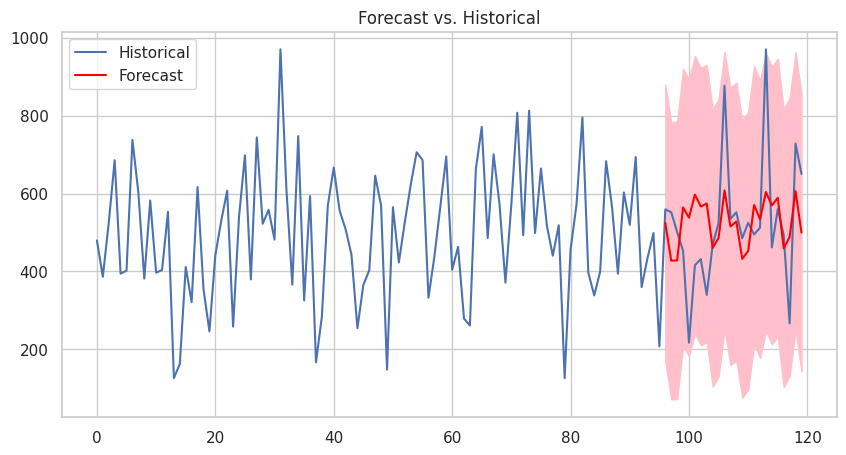

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Assume SARIMAX model is already fitted as `result`
# Split data for training and testing
split_point = int(len(data) * 0.8)  # 80% for training, 20% for testing
train_data = data['CO2_Captured_Tons'][:split_point]
test_data = data['CO2_Captured_Tons'][split_point:]

# Fit SARIMA model on train data
model = SARIMAX(train_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
result = model.fit()

# Forecasting the next period (length of test data)
forecast = result.get_forecast(steps=len(test_data))
forecast_ci = forecast.conf_int()

# Calculate RMSE for the test set as a validation metric
y_true = test_data
y_pred = forecast.predicted_mean
rmse = mean_squared_error(y_true, y_pred, squared=False)
print(f'RMSE: {rmse}')

# Plotting the forecast alongside historical data
plt.figure(figsize=(10, 5))
plt.plot(data['CO2_Captured_Tons'], label='Historical')
plt.plot(test_data.index, forecast.predicted_mean, label='Forecast', color='red')
plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink')
plt.title('Forecast vs. Historical')
plt.legend()
plt.show()

